# 광진구 공원 입지 feature importance 도출 분석

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# 작업 디렉토리 설정
import os
wd = '/content/drive/MyDrive/광진구 공모전 DB/광진구 공모전 데이터/db/전처리 끝난 데이터'
os.chdir(wd)
os.getcwd()

'/content/drive/.shortcut-targets-by-id/1x0l2MxUZZl6XKOnBiXhTarE4yqgw4tkg/광진구 공모전 데이터/db/전처리 끝난 데이터'

In [ ]:
import pandas as pd

In [ ]:
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
fm.fontManager.addfont('/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf')
plt.rc('font', family='NanumBarunGothic')

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  fonts-nanum
0 upgraded, 1 newly installed, 0 to remove and 34 not upgraded.
Need to get 10.3 MB of archives.
After this operation, 34.1 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 fonts-nanum all 20200506-1 [10.3 MB]
Fetched 10.3 MB in 0s (24.2 MB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package fonts-nanum.
(Reading database ... 126101 files and direc

In [ ]:
df_child_parks = pd.read_csv('3어린이공원.csv')
df_child_parks = df_child_parks.drop(columns='Unnamed: 0')
df_child_parks

,공원명,공원구분,소재지지번주소,세부행정동,위도,경도,공원면적,공원보유시설(운동시설),공원보유시설(유희시설),공원보유시설(교양시설),공원보유시설(기타시설)
0,성화공원,어린이공원,서울특별시 광진구 자양동 199-4,자양4동,37.536207,127.061859,253.0,NaN,조합놀이대,NaN,NaN
1,양마장공원,어린이공원,서울특별시 광진구 자양동 689-6,자양2동,37.530871,127.088727,1113.0,NaN,"조합놀이대, 그네, 흔들놀이기구",NaN,NaN
2,자양공원,어린이공원,서울특별시 광진구 자양동 792-1,자양3동,37.533555,127.069863,494.8,NaN,조합놀이대,NaN,NaN
3,가중나무공원,어린이공원,서울특별시 광진구 화양동 32-1,화양동,37.546519,127.067703,971.6,NaN,조합놀이대,NaN,NaN
4,한아름공원,어린이공원,서울특별시 광진구 화양동 12-55,화양동,37.544337,127.070469,936.2,NaN,"조합놀이대, 그네 , 흔들놀이기구",NaN,NaN
5,햇님공원,어린이공원,서울특별시 광진구 화양동 45-3,화양동,37.542693,127.067023,1002.3,NaN,"조합놀이대, 그네 , 시소, 흔들놀이기구",NaN,NaN
6,화양공원,어린이공원,서울특별시 광진구 화양동 8-36,화양동,37.541608,127.069601,996.4,NaN,조합놀이대,NaN,NaN
7,남일공원,어린이공원,서울특별시 광진구 군자동 159-1,군자동,37.555947,127.073690,238.0,NaN,"조합놀이대, 그네",NaN,NaN
8,군자공원,어린이공원,서울특별시 광진구 군자동 115-1,군자동,37.554565,127.072851,642.0,NaN,"조합놀이대, 시소",NaN,경로당
9,중곡공원,어린이공원,서울특별시 광진구 중곡동 232-44,중곡1동,37.564536,127.079141,995.7,NaN,조합놀이대,NaN,경로당


## 0.광진구 내 공원(어린이공원/그 외)

### (1) 데이터 GeoDataFrame으로 변환

In [ ]:
import geopandas as gpd

# 1. 어린이공원 여부를 이진 값으로 표시
df_child_parks['어린이공원_여부'] = df_child_parks['공원구분'].apply(lambda x: 1 if x == '어린이공원' else 0)

# 2. GeoDataFrame으로 변환(위도, 경도 → Point geometry 생성)
from shapely.geometry import Point
geometry = [Point(xy) for xy in zip(df_child_parks['경도'], df_child_parks['위도'])]
gdf_child_parks = gpd.GeoDataFrame(df_child_parks, geometry=geometry, crs='EPSG:4326')

# 3. 분석을 위해 투영 좌표계(EPSG:5181)로 변환(미터 단위)
gdf_child_parks = gdf_child_parks.to_crs(epsg=5181)

# 4. 결과 확인
gdf_child_parks[['공원명', '어린이공원_여부', 'geometry']]

,공원명,어린이공원_여부,geometry
0,성화공원,1,POINT (205467.268 448524.493)
1,양마장공원,1,POINT (207842.503 447934.079)
2,자양공원,1,POINT (206174.893 448230.575)
3,가중나무공원,1,POINT (205982.988 449669.27)
4,한아름공원,1,POINT (206227.523 449427.286)
5,햇님공원,1,POINT (205923.136 449244.655)
6,화양공원,1,POINT (206151.039 449124.34)
7,남일공원,1,POINT (206511.233 450716.141)
8,군자공원,1,POINT (206437.183 450562.66)
9,중곡공원,1,POINT (206992.051 451669.788)


 ### (2) 격자 생성

In [ ]:
from shapely.geometry import box

# 5. 분석 대상 영역의 범위 설정
minx, miny, maxx, maxy = gdf_child_parks.total_bounds

# 6. 격자 크기 정의(100m×100m)
grid_size = 100

# 7. 격자 생성(Polygon geometry)
grid_cells = []
x = minx
while x < maxx:
    y = miny
    while y < maxy:
        cell = box(x, y, x + grid_size, y + grid_size)
        grid_cells.append(cell)
        y += grid_size
    x += grid_size

# 8. GeoDataFrame으로 변환
grid_gdf_child_parks = gpd.GeoDataFrame(geometry=grid_cells, crs="EPSG:5181")

# 9. 결과 확인
grid_gdf_child_parks

,geometry
0,"POLYGON ((205567.268 447871.309, 205567.268 44..."
1,"POLYGON ((205567.268 447971.309, 205567.268 44..."
2,"POLYGON ((205567.268 448071.309, 205567.268 44..."
3,"POLYGON ((205567.268 448171.309, 205567.268 44..."
4,"POLYGON ((205567.268 448271.309, 205567.268 44..."
...,...
1629,"POLYGON ((209267.268 451671.309, 209267.268 45..."
1630,"POLYGON ((209267.268 451771.309, 209267.268 45..."
1631,"POLYGON ((209267.268 451871.309, 209267.268 45..."
1632,"POLYGON ((209267.268 451971.309, 209267.268 45..."


 ### (3) 시각화(※못생김)

In [ ]:
# 공원 데이터와 격자 데이터를 spatial join으로 연결
temp = gpd.sjoin(gdf_child_parks, grid_gdf_child_parks, how="left", predicate="intersects")

# 결과 확인 (공원명, 어린이공원 여부, 해당 격자 geometry 등)
temp[['공원명', '어린이공원_여부', 'geometry', 'index_right']]

,공원명,어린이공원_여부,geometry,index_right
0,성화공원,1,POINT (205467.268 448524.493),6
1,양마장공원,1,POINT (207842.503 447934.079),989
2,자양공원,1,POINT (206174.893 448230.575),304
3,가중나무공원,1,POINT (205982.988 449669.27),232
4,한아름공원,1,POINT (206227.523 449427.286),316
5,햇님공원,1,POINT (205923.136 449244.655),185
6,화양공원,1,POINT (206151.039 449124.34),270
7,남일공원,1,POINT (206511.233 450716.141),458
8,군자공원,1,POINT (206437.183 450562.66),413
9,중곡공원,1,POINT (206992.051 451669.788),682


In [ ]:
import folium
from shapely.geometry import Point
import geopandas as gpd
import matplotlib.pyplot as plt

# 1. 격자 중심점 컬럼 추가
grid_gdf_child_parks['centroid'] = grid_gdf_child_parks.centroid

# 2. 중심점 기준 250m 버퍼 생성
grid_gdf_child_parks['buffer_250m'] = gdf_child_parks['geometry'].buffer(250)

# 5. folium용 좌표계 변환 (EPSG:4326)
gdf_child_parks_4326 = gdf_child_parks.to_crs(epsg=4326)
grid_gdf_4326 = grid_gdf_child_parks.to_crs(epsg=4326)
buffer_gdf = gpd.GeoDataFrame(geometry=grid_gdf_child_parks['buffer_250m'], crs='EPSG:5181').to_crs(epsg=4326)

# ❗ None geometry 제거
buffer_gdf = buffer_gdf.dropna(subset=['geometry'])

# 6. folium 지도 생성
m = folium.Map(location=[gdf_child_parks_4326.geometry.y.mean(), gdf_child_parks_4326.geometry.x.mean()],
               zoom_start=14, tiles='cartodbpositron')

# 7. 격자 시각화 (회색 선)
for _, row in grid_gdf_4326.iterrows():
    folium.GeoJson(row.geometry, style_function=lambda x: {'color': 'lightgray', 'weight': 1, 'fillOpacity': 0}).add_to(m)

# 8. 250m 버퍼 시각화 (파란 반투명 원)
for _, row in buffer_gdf.iterrows():
    folium.GeoJson(row.geometry, style_function=lambda x: {
        'fillColor': 'blue', 'color': 'blue', 'weight': 1, 'fillOpacity': 0.2
    }).add_to(m)

# 9. 공원 시각화 (연하늘색 = 어린이공원, 초록색 = 소공원)
for _, row in gdf_child_parks_4326.iterrows():
    color = 'green' if row['어린이공원_여부'] == 1 else 'blue'
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=4,
        color=color,
        fill=True,
        fill_opacity=0.8,
        popup=row['공원명']
    ).add_to(m)

legend_html = """
<div style="
    position: fixed;
    bottom: 600px; left: 380px; width: 170px; height: 100px;
    background-color: white; z-index:9999; font-size:14px;
    border:2px solid lightgray; border-radius:8px;
    box-shadow:2px 2px 6px rgba(0,0,0,0.3);
    padding: 10px;">
    <b>🗺️ 범례</b><br>
    <i style="color:skyblue;">●</i> 어린이공원<br>
    <i style="color:green;">●</i> 소공원<br>
    <i style="color:blue; opacity:0.6;">◯</i> 공원 반경 250m
</div>
"""
m.get_root().html.add_child(folium.Element(legend_html))

# 10. 지도 출력
m

In [ ]:
from pyproj import Transformer
transformer = Transformer.from_crs("EPSG:5181", "EPSG:4326", always_xy=True)

# folium 지도 생성
import folium
m = folium.Map(location=[37.538, 127.082], zoom_start=13.3, tiles='cartodbpositron')

# 격자 표시
for _, row in grid_gdf_child_parks.iterrows():
    coords = [(transformer.transform(x, y)[1], transformer.transform(x, y)[0]) for x, y in row.geometry.exterior.coords]
    folium.PolyLine(locations=coords, color='gray', weight=0.7, opacity=0.4).add_to(m)

# 공원 위치 마커
for _, row in temp.iterrows():
    lat, lon = transformer.transform(row.geometry.x, row.geometry.y)[1], transformer.transform(row.geometry.x, row.geometry.y)[0]
    color = 'lightblue' if row['어린이공원_여부'] == 1 else 'green'
    folium.CircleMarker(
        location=[lat, lon],
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.8,
        popup=f"{row['공원명']}<br>격자 인덱스: {row['index_right']}"
    ).add_to(m)

m

## 1.초등학교

In [ ]:
df_elementary_schools = pd.read_csv('8초등학교.csv')
df_elementary_schools.head(2)

,Unnamed: 0,학교명,도로명주소,위도,경도
0,0,세종초등학교,서울특별시 광진구 군자로 114,37.553011,127.072865
1,1,성동초등학교,서울특별시 광진구 자양로4길 63,37.533281,127.089281


In [ ]:
geometry = [Point(xy) for xy in zip(df_elementary_schools['경도'], df_elementary_schools['위도'])]
gdf_elementary_schools = gpd.GeoDataFrame(df_elementary_schools, geometry=geometry, crs='EPSG:4326')

gdf_elementary_schools = gdf_elementary_schools.to_crs(epsg=5181)
gdf_elementary_schools.head(2)

,Unnamed: 0,학교명,도로명주소,위도,경도,geometry
0,0,세종초등학교,서울특별시 광진구 군자로 114,37.553011,127.072865,POINT (206438.53 450390.19)
1,1,성동초등학교,서울특별시 광진구 자양로4길 63,37.533281,127.089281,POINT (207891.21 448201.68)


In [ ]:
# 격자 중심 계산
grid_gdf_child_parks['centroid'] = grid_gdf_child_parks.geometry.centroid

# 250m 버퍼 생성 (공원 기준)
park_buffers = gdf_child_parks.copy()
park_buffers['buffer'] = park_buffers.geometry.buffer(250)

# 각 격자별로 초등학교 수 계산 (단, 공원 반경 250m 내에 있을 때만)
grid_gdf_child_parks['초등학교_수'] = 0  # 기본값 0인 '초등학교_수' 컬럼 생성

for buffer_geom in park_buffers['buffer']:
    # 해당 공원의 버퍼 안에 있는 격자만 선택
    target_grids = grid_gdf_child_parks[grid_gdf_child_parks.centroid.within(buffer_geom)].copy()

    for idx, row in target_grids.iterrows():
        centroid = row['centroid']
        count = gdf_elementary_schools.distance(centroid) <= 250
        school_count = count.sum()
        # 최대값 갱신 방식(공원 영역 중복 회피)
        grid_gdf_child_parks.at[idx, '초등학교_수'] = max(grid_gdf_child_parks.at[idx, '초등학교_수'], school_count)

# 결과 확인
grid_gdf_child_parks[grid_gdf_child_parks['초등학교_수'] != 0]

,geometry,centroid,초등학교_수
218,"POLYGON ((206067.268 448171.309, 206067.268 44...",POINT (206017.268 448221.309),1
219,"POLYGON ((206067.268 448271.309, 206067.268 44...",POINT (206017.268 448321.309),1
220,"POLYGON ((206067.268 448371.309, 206067.268 44...",POINT (206017.268 448421.309),1
221,"POLYGON ((206067.268 448471.309, 206067.268 44...",POINT (206017.268 448521.309),1
260,"POLYGON ((206167.268 448071.309, 206167.268 44...",POINT (206117.268 448121.309),1
...,...,...,...
1526,"POLYGON ((209067.268 449971.309, 209067.268 45...",POINT (209017.268 450021.309),1
1566,"POLYGON ((209167.268 449671.309, 209167.268 44...",POINT (209117.268 449721.309),1
1567,"POLYGON ((209167.268 449771.309, 209167.268 44...",POINT (209117.268 449821.309),1
1568,"POLYGON ((209167.268 449871.309, 209167.268 44...",POINT (209117.268 449921.309),1


## 2.유치원

In [ ]:
df_kindergartens= pd.read_csv('7유치원.csv')
df_kindergartens.head(2)

,Unnamed: 0,유치원코드,유치원명,주소,위도,경도
0,61,1ecec08c-eee1-b044-e053-0a32095ab044,선경유치원,서울특별시 광진구 뚝섬로66길 14,37.533396,127.089785
1,62,1ecec08c-eee2-b044-e053-0a32095ab044,성산유치원,서울특별시 광진구 뚝섬로59길 18,37.532909,127.084178


In [ ]:
geometry = [Point(xy) for xy in zip(df_kindergartens['경도'], df_kindergartens['위도'])]
gdf_kindergartens = gpd.GeoDataFrame(df_kindergartens, geometry=geometry, crs='EPSG:4326')

gdf_kindergartens = gdf_kindergartens.to_crs(epsg=5181)
gdf_kindergartens.head(2)

,Unnamed: 0,유치원코드,유치원명,주소,위도,경도,geometry
0,61,1ecec08c-eee1-b044-e053-0a32095ab044,선경유치원,서울특별시 광진구 뚝섬로66길 14,37.533396,127.089785,POINT (207935.75 448214.45)
1,62,1ecec08c-eee2-b044-e053-0a32095ab044,성산유치원,서울특별시 광진구 뚝섬로59길 18,37.532909,127.084178,POINT (207440.17 448159.91)


In [ ]:
# 각 공원 반경 250m 이내 유치원 수 계산
grid_gdf_child_parks['유치원_수'] = 0

for buffer_geom in park_buffers['buffer']:
    # 해당 공원의 버퍼 안에 있는 격자만 선택
    target_grids = grid_gdf_child_parks[grid_gdf_child_parks.centroid.within(buffer_geom)].copy()

    for idx, row in target_grids.iterrows():
        centroid = row['centroid']
        count = gdf_kindergartens.distance(centroid) <= 250
        school_count = count.sum()
        # 최대값 갱신 방식 (중복 피하기 위해)
        grid_gdf_child_parks.at[idx, '유치원_수'] = max(grid_gdf_child_parks.at[idx, '유치원_수'], school_count)

# 결과 확인
grid_gdf_child_parks[grid_gdf_child_parks['유치원_수'] != 0]

,geometry,centroid,초등학교_수,유치원_수
4,"POLYGON ((205567.268 448271.309, 205567.268 44...",POINT (205517.268 448321.309),0,1
5,"POLYGON ((205567.268 448371.309, 205567.268 44...",POINT (205517.268 448421.309),0,1
6,"POLYGON ((205567.268 448471.309, 205567.268 44...",POINT (205517.268 448521.309),0,2
7,"POLYGON ((205567.268 448571.309, 205567.268 44...",POINT (205517.268 448621.309),0,2
8,"POLYGON ((205567.268 448671.309, 205567.268 44...",POINT (205517.268 448721.309),0,2
...,...,...,...,...
1568,"POLYGON ((209167.268 449871.309, 209167.268 44...",POINT (209117.268 449921.309),1,1
1606,"POLYGON ((209267.268 449371.309, 209267.268 44...",POINT (209217.268 449421.309),0,1
1607,"POLYGON ((209267.268 449471.309, 209267.268 44...",POINT (209217.268 449521.309),0,1
1609,"POLYGON ((209267.268 449671.309, 209267.268 44...",POINT (209217.268 449721.309),0,1


## 3.지역아동센터



In [ ]:
df_child_centers= pd.read_csv('6아동센터.csv')
df_child_centers.head(2)

,Unnamed: 0,시설명,시설주소,시설종류명(시설유형),위도,경도
0,18,새움터지역아동센터,"서울특별시 광진구 자양로 71-7, 3층 (자양동, 희년의집)",(아동복지시설) 지역아동센터,37.534086,127.083905
1,19,해피엘지역아동센터,서울특별시 광진구 자양번영로 16 (자양동),(아동복지시설) 지역아동센터,37.531005,127.075249


In [ ]:
geometry = [Point(xy) for xy in zip(df_child_centers['경도'], df_child_centers['위도'])]
gdf_child_centers = gpd.GeoDataFrame(df_child_centers, geometry=geometry, crs='EPSG:4326')

gdf_child_centers = gdf_child_centers.to_crs(epsg=5181)

# 각 공원 반경 250m 이내 지역아동센터 수 계산
grid_gdf_child_parks['지역아동센터_수'] = 0

for buffer_geom in park_buffers['buffer']:
    # 해당 공원의 버퍼 안에 있는 격자만 선택
    target_grids = grid_gdf_child_parks[grid_gdf_child_parks.centroid.within(buffer_geom)].copy()

    for idx, row in target_grids.iterrows():
        centroid = row['centroid']
        count = gdf_child_centers.distance(centroid) <= 250
        school_count = count.sum()
        # 최대값 갱신 방식 (중복 피하기 위해)
        grid_gdf_child_parks.at[idx, '지역아동센터_수'] = max(grid_gdf_child_parks.at[idx, '지역아동센터_수'], school_count)

# 결과 확인
grid_gdf_child_parks[grid_gdf_child_parks['지역아동센터_수'] != 0]

,geometry,centroid,초등학교_수,유치원_수,지역아동센터_수
4,"POLYGON ((205567.268 448271.309, 205567.268 44...",POINT (205517.268 448321.309),0,1,1
5,"POLYGON ((205567.268 448371.309, 205567.268 44...",POINT (205517.268 448421.309),0,1,1
6,"POLYGON ((205567.268 448471.309, 205567.268 44...",POINT (205517.268 448521.309),0,2,1
7,"POLYGON ((205567.268 448571.309, 205567.268 44...",POINT (205517.268 448621.309),0,2,1
8,"POLYGON ((205567.268 448671.309, 205567.268 44...",POINT (205517.268 448721.309),0,2,1
...,...,...,...,...,...
1260,"POLYGON ((208467.268 449171.309, 208467.268 44...",POINT (208417.268 449221.309),0,1,1
1300,"POLYGON ((208567.268 448871.309, 208567.268 44...",POINT (208517.268 448921.309),0,1,1
1301,"POLYGON ((208567.268 448971.309, 208567.268 44...",POINT (208517.268 449021.309),0,0,1
1302,"POLYGON ((208567.268 449071.309, 208567.268 44...",POINT (208517.268 449121.309),0,1,1


## 4.키즈카페

In [ ]:
df_kids_cafes = pd.read_csv('9키즈카페.csv')
df_kids_cafes.head(2)

,Unnamed: 0,시설명,기본주소,위도,경도
0,23,서울형키즈카페 시립 팔각당점,서울특별시 광진구 능동로 216,37.549857,127.082471
1,25,서울형 키즈카페 자양4동 2호점(꾸미팡팡 놀이터),서울특별시 광진구 능동로 87,37.539160,127.069640


In [ ]:
geometry = [Point(xy) for xy in zip(df_kids_cafes['경도'], df_kids_cafes['위도'])]
gdf_kids_cafes = gpd.GeoDataFrame(df_kids_cafes, geometry=geometry, crs='EPSG:4326')

gdf_kids_cafes = gdf_kids_cafes.to_crs(epsg=5181)

# 각 공원 반경 250m 이내 키즈카페 수 계산
grid_gdf_child_parks['키즈카페_수'] = 0

for buffer_geom in park_buffers['buffer']:
    # 해당 공원의 버퍼 안에 있는 격자만 선택
    target_grids = grid_gdf_child_parks[grid_gdf_child_parks.centroid.within(buffer_geom)].copy()

    for idx, row in target_grids.iterrows():
        centroid = row['centroid']
        count = gdf_kids_cafes.distance(centroid) <= 250
        school_count = count.sum()
        # 최대값 갱신 방식 (중복 피하기 위해)
        grid_gdf_child_parks.at[idx, '키즈카페_수'] = max(grid_gdf_child_parks.at[idx, '키즈카페_수'], school_count)

# 결과 확인
grid_gdf_child_parks[grid_gdf_child_parks['키즈카페_수'] != 0]

,geometry,centroid,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수
87,"POLYGON ((205767.268 447971.309, 205767.268 44...",POINT (205717.268 448021.309),0,0,1,1
129,"POLYGON ((205867.268 447871.309, 205867.268 44...",POINT (205817.268 447921.309),0,0,1,1
130,"POLYGON ((205867.268 447971.309, 205867.268 44...",POINT (205817.268 448021.309),0,0,1,1
172,"POLYGON ((205967.268 447871.309, 205967.268 44...",POINT (205917.268 447921.309),0,0,1,1
173,"POLYGON ((205967.268 447971.309, 205967.268 44...",POINT (205917.268 448021.309),0,0,1,1
181,"POLYGON ((205967.268 448771.309, 205967.268 44...",POINT (205917.268 448821.309),0,0,1,2
182,"POLYGON ((205967.268 448871.309, 205967.268 44...",POINT (205917.268 448921.309),0,0,1,2
215,"POLYGON ((206067.268 447871.309, 206067.268 44...",POINT (206017.268 447921.309),0,0,1,1
223,"POLYGON ((206067.268 448671.309, 206067.268 44...",POINT (206017.268 448721.309),0,0,0,2
224,"POLYGON ((206067.268 448771.309, 206067.268 44...",POINT (206017.268 448821.309),0,0,0,2


## 5.청소년 유해업소·구역

*   유흥주점
*   단란주점

*   노래연습장
*   비디오물감상실

*  일반게임제공업
*  복합유통게임제공업

In [ ]:
df_hazardous_facilities = pd.read_csv('4청소년 유해시설(업종추가).csv')
df_hazardous_facilities.tail(2)

,Unnamed: 0,사업장명,상세영업상태명,지번주소,업종명,위도,경도
385,385,Fun City,영업중,서울특별시 광진구 화양동 9-91 캠퍼스 프라자,복합유통게임제공업,37.541510,127.068690
386,386,쌈바플스방,영업중,서울특별시 광진구 화양동 3-37번지,복합유통게임제공업,37.542692,127.071605


In [ ]:
geometry = [Point(xy) for xy in zip(df_hazardous_facilities['경도'], df_hazardous_facilities['위도'])]
gdf_hazardous_facilities = gpd.GeoDataFrame(df_hazardous_facilities, geometry=geometry, crs='EPSG:4326')

gdf_hazardous_facilities = gdf_hazardous_facilities.to_crs(epsg=5181)

# 각 공원 반경 250m 이내 청소년유해업소 수 계산
grid_gdf_child_parks['청소년유해업소_수'] = 0

for buffer_geom in park_buffers['buffer']:
    # 해당 공원의 버퍼 안에 있는 격자만 선택
    target_grids = grid_gdf_child_parks[grid_gdf_child_parks.centroid.within(buffer_geom)].copy()

    for idx, row in target_grids.iterrows():
        centroid = row['centroid']
        count = gdf_hazardous_facilities.distance(centroid) <= 250
        school_count = count.sum()
        # 최대값 갱신 방식 (중복 피하기 위해)
        grid_gdf_child_parks.at[idx, '청소년유해업소_수'] = max(grid_gdf_child_parks.at[idx, '청소년유해업소_수'], school_count)

# 결과 확인
grid_gdf_child_parks[grid_gdf_child_parks['청소년유해업소_수'] != 0]

,geometry,centroid,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수
4,"POLYGON ((205567.268 448271.309, 205567.268 44...",POINT (205517.268 448321.309),0,1,1,0,3
5,"POLYGON ((205567.268 448371.309, 205567.268 44...",POINT (205517.268 448421.309),0,1,1,0,8
6,"POLYGON ((205567.268 448471.309, 205567.268 44...",POINT (205517.268 448521.309),0,2,1,0,9
7,"POLYGON ((205567.268 448571.309, 205567.268 44...",POINT (205517.268 448621.309),0,2,1,0,8
8,"POLYGON ((205567.268 448671.309, 205567.268 44...",POINT (205517.268 448721.309),0,2,1,0,8
...,...,...,...,...,...,...,...
1303,"POLYGON ((208567.268 449171.309, 208567.268 44...",POINT (208517.268 449221.309),0,1,1,0,2
1339,"POLYGON ((208667.268 448471.309, 208667.268 44...",POINT (208617.268 448521.309),0,0,0,0,1
1608,"POLYGON ((209267.268 449571.309, 209267.268 44...",POINT (209217.268 449621.309),0,0,0,0,1
1609,"POLYGON ((209267.268 449671.309, 209267.268 44...",POINT (209217.268 449721.309),0,1,0,0,2


## 6.공영주차장

In [ ]:
df_public_parking_lot = pd.read_csv('13주차장.csv')
df_public_parking_lot = df_public_parking_lot[df_public_parking_lot['위도'].notna()]
df_public_parking_lot.isna().sum()

,0
Unnamed: 0,0
ID,0
주차장명,0
주차장유형,0
지번주소,0
위도,0
경도,0


In [ ]:
geometry = [Point(xy) for xy in zip(df_public_parking_lot['경도'], df_public_parking_lot['위도'])]
gdf_public_parking_lot = gpd.GeoDataFrame(df_public_parking_lot, geometry=geometry, crs='EPSG:4326')

gdf_public_parking_lot = gdf_public_parking_lot.to_crs(epsg=5181)

# 각 공원 반경 250m 이내 공영주차장 수 계산
grid_gdf_child_parks['공영주차장_수'] = 0

for buffer_geom in park_buffers['buffer']:
    # 해당 공원의 버퍼 안에 있는 격자만 선택
    target_grids = grid_gdf_child_parks[grid_gdf_child_parks.centroid.within(buffer_geom)].copy()

    for idx, row in target_grids.iterrows():
        centroid = row['centroid']
        count = gdf_public_parking_lot.distance(centroid) <= 250
        school_count = count.sum()
        # 최대값 갱신 방식 (중복 피하기 위해)
        grid_gdf_child_parks.at[idx, '공영주차장_수'] = max(grid_gdf_child_parks.at[idx, '공영주차장_수'], school_count)

# 결과 확인
grid_gdf_child_parks[grid_gdf_child_parks['공영주차장_수'] != 0]

,geometry,centroid,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수
4,"POLYGON ((205567.268 448271.309, 205567.268 44...",POINT (205517.268 448321.309),0,1,1,0,3,1
5,"POLYGON ((205567.268 448371.309, 205567.268 44...",POINT (205517.268 448421.309),0,1,1,0,8,1
6,"POLYGON ((205567.268 448471.309, 205567.268 44...",POINT (205517.268 448521.309),0,2,1,0,9,1
48,"POLYGON ((205667.268 448371.309, 205667.268 44...",POINT (205617.268 448421.309),0,1,1,0,11,1
49,"POLYGON ((205667.268 448471.309, 205667.268 44...",POINT (205617.268 448521.309),0,2,1,0,13,1
...,...,...,...,...,...,...,...,...
1188,"POLYGON ((208267.268 450571.309, 208267.268 45...",POINT (208217.268 450621.309),0,0,2,0,1,1
1213,"POLYGON ((208367.268 448771.309, 208367.268 44...",POINT (208317.268 448821.309),0,0,1,0,8,1
1229,"POLYGON ((208367.268 450371.309, 208367.268 45...",POINT (208317.268 450421.309),0,1,0,0,2,1
1230,"POLYGON ((208367.268 450471.309, 208367.268 45...",POINT (208317.268 450521.309),0,1,0,0,1,1


## 7.노인복지시설

In [ ]:
df_senior_welfare_facilities = pd.read_csv('11노인복지(결측값 삭제).csv')
# df_senior_welfare_facilities = df_senior_welfare_facilities[df_senior_welfare_facilities['위도'].notna()]
# 또는 df_senior_welfare_facilities = df_senior_welfare_facilities.dropna(subset=['위도']) 로 '11노인복지.csv'의 결측값을 삭제하고 저장하였음
df_senior_welfare_facilities.isna().sum()

,0
Unnamed: 0,0
시설명,0
시설주소,0
시설종류명(시설유형),0
위도,0
경도,0


In [ ]:
geometry = [Point(xy) for xy in zip(df_senior_welfare_facilities['경도'], df_senior_welfare_facilities['위도'])]
gdf_senior_welfare_facilities = gpd.GeoDataFrame(df_senior_welfare_facilities, geometry=geometry, crs='EPSG:4326')

gdf_senior_welfare_facilities = gdf_senior_welfare_facilities.to_crs(epsg=5181)

# 각 공원 반경 250m 이내 노인복지시설 수 계산
grid_gdf_child_parks['노인복지시설_수'] = 0

for buffer_geom in park_buffers['buffer']:
    # 해당 공원의 버퍼 안에 있는 격자만 선택
    target_grids = grid_gdf_child_parks[grid_gdf_child_parks.centroid.within(buffer_geom)].copy()

    for idx, row in target_grids.iterrows():
        centroid = row['centroid']
        count = gdf_senior_welfare_facilities.distance(centroid) <= 250
        school_count = count.sum()
        # 최대값 갱신 방식 (중복 피하기 위해)
        grid_gdf_child_parks.at[idx, '노인복지시설_수'] = max(grid_gdf_child_parks.at[idx, '노인복지시설_수'], school_count)

# 결과 확인
grid_gdf_child_parks[grid_gdf_child_parks['노인복지시설_수'] != 0]

,geometry,centroid,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수
48,"POLYGON ((205667.268 448371.309, 205667.268 44...",POINT (205617.268 448421.309),0,1,1,0,11,1,1
49,"POLYGON ((205667.268 448471.309, 205667.268 44...",POINT (205617.268 448521.309),0,2,1,0,13,1,1
89,"POLYGON ((205767.268 448171.309, 205767.268 44...",POINT (205717.268 448221.309),0,0,0,0,0,1,1
90,"POLYGON ((205767.268 448271.309, 205767.268 44...",POINT (205717.268 448321.309),0,0,0,0,6,1,1
98,"POLYGON ((205767.268 449071.309, 205767.268 44...",POINT (205717.268 449121.309),0,1,1,0,20,0,1
...,...,...,...,...,...,...,...,...,...
1567,"POLYGON ((209167.268 449771.309, 209167.268 44...",POINT (209117.268 449821.309),1,1,0,0,0,0,1
1568,"POLYGON ((209167.268 449871.309, 209167.268 44...",POINT (209117.268 449921.309),1,1,0,0,0,0,1
1608,"POLYGON ((209267.268 449571.309, 209267.268 44...",POINT (209217.268 449621.309),0,0,0,0,1,0,1
1609,"POLYGON ((209267.268 449671.309, 209267.268 44...",POINT (209217.268 449721.309),0,1,0,0,2,0,1


## 8.공시지가




In [ ]:
path = '/content/drive/MyDrive/광진구 공모전 DB/광진구 공모전 데이터/db/2광진구_공시지가_100/nlsp_021004001.shp'

# 좌표계 변환
gdf_land_price = gpd.read_file(path).to_crs(epsg=5181)

# 컬럼명 변경
gdf_land_price = gdf_land_price.rename(columns={'val': '공시지가'})

gdf_land_price.head(2)

,gid,lbl,공시지가,geometry
0,ë¤ì¬629496,5658798.87,5658798.87,"POLYGON ((207071.426 449499.947, 207070.894 44..."
1,ë¤ì¬636494,4395647.73,4395647.73,"POLYGON ((207772.749 449303.597, 207772.217 44..."


In [ ]:
# # Spatial Join
# centroids_gdf = gpd.GeoDataFrame(grid_gdf_child_parks[['centroid']], geometry='centroid', crs='EPSG:5181')
# grid_land_price = gpd.sjoin(centroids_gdf, gdf_land_price[['geometry', '공시지가']], how='left', predicate='within')

# # 원래 격자와 merge
# grid_gdf_child_parks['공시지가'] = grid_land_price['공시지가'].fillna(0)

# # 결과 확인
# grid_gdf_child_parks.head(10)  # 공시지가가 0인 건 뭐지...?

,geometry,centroid,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수,공시지가
0,"POLYGON ((205567.268 447871.309, 205567.268 44...",POINT (205517.268 447921.309),0,0,0,0,0,0,0,0.00
1,"POLYGON ((205567.268 447971.309, 205567.268 44...",POINT (205517.268 448021.309),0,0,0,0,0,0,0,446600.00
2,"POLYGON ((205567.268 448071.309, 205567.268 44...",POINT (205517.268 448121.309),0,0,0,0,0,0,0,2095019.27
3,"POLYGON ((205567.268 448171.309, 205567.268 44...",POINT (205517.268 448221.309),0,0,0,0,0,0,0,4379452.33
4,"POLYGON ((205567.268 448271.309, 205567.268 44...",POINT (205517.268 448321.309),0,1,1,0,3,1,0,4454848.04
5,"POLYGON ((205567.268 448371.309, 205567.268 44...",POINT (205517.268 448421.309),0,1,1,0,8,1,0,4413237.85
6,"POLYGON ((205567.268 448471.309, 205567.268 44...",POINT (205517.268 448521.309),0,2,1,0,9,1,0,5155470.16
7,"POLYGON ((205567.268 448571.309, 205567.268 44...",POINT (205517.268 448621.309),0,2,1,0,8,0,0,5711200.13
8,"POLYGON ((205567.268 448671.309, 205567.268 44...",POINT (205517.268 448721.309),0,2,1,0,8,0,0,7320398.57
9,"POLYGON ((205567.268 448771.309, 205567.268 44...",POINT (205517.268 448821.309),0,0,0,0,0,0,0,6179180.08


---
### 문제 발생: 매핑 누락(NaN) 발생
---

grid_gdf_child_parks 매핑 결과 공시지가 값이 0인 Polygon이 발생한 이유(※공시지가 값 자체는 0일 수 있음)


 *  spatial join이 제대로 안 되었거나, 공시지가 데이터와 각 공원들의 격자 중심점(centroid)의 위치가 겹치지 않았을 경우

 *  predicate='within'은 격자 중심점이 gdf_land_price의 geometry (토지 필지 polygon) 안에 '완전히 포함될 때만' join되기 때문에, 중심점이 조금만 벗어나 있어도 매칭이 되지 않아 NaN → 0으로 처리됐을 가능성이 높음

  * how="intersects(완전히 포함되지 않아도 걸치면 포함)로 바꾸면 중심점이 토지 polygon에 '겹치기만 해도' join이 성사되므로 누락이 줄어듦

  * 다만, 중심점이 겹치는 여러 필지가 있을 경우 다수 행이 매핑될 수 있음. 이럴 경우, 각 격자의 중심점이 겹친 토지 Polygon들의 공시지가의 평균으로 대치 가능

---

In [ ]:
# 매핑이 얼마나 누락되었는지 확인
missing = grid_gdf_child_parks[grid_gdf_child_parks['공시지가'] == 0]
print(f"공시지가 누락된 격자 수: {len(missing)}")

공시지가 누락된 격자 수: 540


In [ ]:
# Spatial Join 조건 변경
centroids_gdf = gpd.GeoDataFrame(grid_gdf_child_parks[['centroid']], geometry='centroid', crs='EPSG:5181')
grid_land_price = gpd.sjoin(centroids_gdf, gdf_land_price[['geometry', '공시지가']], how='left', predicate='intersects')

# 격자 인덱스별 공시지가 평균 계산 (중복 매핑 고려)
mean_by_idx = grid_land_price.groupby(grid_land_price.index)['공시지가'].mean()

# 원래 격자와 merge
# grid_gdf_child_parks['공시지가'] = grid_land_price['공시지가'].fillna(0)
grid_gdf_child_parks['공시지가'] = grid_gdf_child_parks.index.map(mean_by_idx).fillna(0)

# 결과 확인
grid_gdf_child_parks.head(10)

,geometry,centroid,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수,공시지가
0,"POLYGON ((205567.268 447871.309, 205567.268 44...",POINT (205517.268 447921.309),0,0,0,0,0,0,0,0.00
1,"POLYGON ((205567.268 447971.309, 205567.268 44...",POINT (205517.268 448021.309),0,0,0,0,0,0,0,446600.00
2,"POLYGON ((205567.268 448071.309, 205567.268 44...",POINT (205517.268 448121.309),0,0,0,0,0,0,0,2095019.27
3,"POLYGON ((205567.268 448171.309, 205567.268 44...",POINT (205517.268 448221.309),0,0,0,0,0,0,0,4379452.33
4,"POLYGON ((205567.268 448271.309, 205567.268 44...",POINT (205517.268 448321.309),0,1,1,0,3,1,0,4454848.04
5,"POLYGON ((205567.268 448371.309, 205567.268 44...",POINT (205517.268 448421.309),0,1,1,0,8,1,0,4413237.85
6,"POLYGON ((205567.268 448471.309, 205567.268 44...",POINT (205517.268 448521.309),0,2,1,0,9,1,0,5155470.16
7,"POLYGON ((205567.268 448571.309, 205567.268 44...",POINT (205517.268 448621.309),0,2,1,0,8,0,0,5711200.13
8,"POLYGON ((205567.268 448671.309, 205567.268 44...",POINT (205517.268 448721.309),0,2,1,0,8,0,0,7320398.57
9,"POLYGON ((205567.268 448771.309, 205567.268 44...",POINT (205517.268 448821.309),0,0,0,0,0,0,0,6179180.08


In [ ]:
count_by_idx = grid_land_price.groupby(grid_land_price.index).size()
count_by_idx.value_counts()  # 겹치는 필지 없음

,count
1,1634


In [ ]:
import folium
import branca.colormap as cm

# 1. 좌표계 변환
gdf_4326 = grid_gdf_child_parks.to_crs(epsg=4326)

# 2. 중심점 GeoDataFrame 따로 만들기
gdf_4326['공시지가'] = gdf_4326['공시지가'].fillna(0)
gdf_4326['centroid_geom'] = gdf_4326.geometry.centroid  # 중심점 geometry 저장
centroids_gdf = gpd.GeoDataFrame(
    gdf_4326[['공시지가']],
    geometry=gdf_4326['centroid_geom'],
    crs='EPSG:4326'
)

# 3. 컬러맵 설정
colormap = cm.linear.YlOrRd_09.scale(
    gdf_4326['공시지가'].min(),
    gdf_4326['공시지가'].max()
)
colormap.caption = '공시지가 (원/m²)'

# 4. 지도 생성
m = folium.Map(location=[37.54, 127.08], zoom_start=13, tiles='cartodbpositron')

# 5. 격자 시각화
folium.GeoJson(
    gdf_4326.drop(columns=['centroid', 'centroid_geom'], errors='ignore'),
    style_function=lambda feature: {
        'fillColor': colormap(feature['properties']['공시지가']),
        'color': 'gray',
        'weight': 0.5,
        'fillOpacity': 0.6
    },
    tooltip=folium.GeoJsonTooltip(fields=['공시지가'], aliases=['공시지가:'])
).add_to(m)

# 6. 중심점: 매핑 성공/실패에 따라 색 다르게
for _, row in centroids_gdf.iterrows():
    color = '#4A90E2' if row['공시지가'] > 0 else '#F5A9A9'  # 파스텔톤 색상
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=1.2,
        color=color,
        fill=True,
        fill_opacity=0.8
    ).add_to(m)

# 7. 컬러맵 추가
colormap.add_to(m)

# 8. 지도 출력
m

<ipython-input-31-96cae7731a9d>:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_4326['centroid_geom'] = gdf_4326.geometry.centroid  # 중심점 geometry 저장


In [ ]:
# join 조건 변경 후 공시지가가 누락된 격자 수에 변화가 있는지 확인 → 변화 없음
missing = grid_gdf_child_parks[grid_gdf_child_parks['공시지가'] == 0]
print(f"공시지가 누락된 격자 수: {len(missing)}")

공시지가 누락된 격자 수: 540


In [ ]:
# gdf_land_price의 geometry가 빈 geometry는 아닌지, 일부 Polygon이 실제로는 유효하지 않거나 너무 작거나 깨져있는 건 아닌지 확인
print("유효하지 않은 Polygon 수:", gdf_land_price[~gdf_land_price.is_valid].shape[0])

유효하지 않은 Polygon 수: 0


In [ ]:
# 정말 중심점들이 공시지가 Polygon과 겹치지 않는지 샘플 시각화를 통해 확인
import matplotlib.pyplot as plt

# 중심점 + 공시지가 Polygon 몇 개 샘플 시각화
sample = centroids_gdf.sample(30)

base = gdf_land_price.plot(edgecolor='gray', facecolor='none', figsize=(10, 10))
sample.plot(ax=base, color='red')



---

predicate 조건을 바꾸어도 공시지가 매핑이 누락되는 이유

 *   시각화 결과, 빨간 점(centroids)이 공시지가 Polygon 안에 정확히 들어가지 않는 경우가 있음
 *   즉, centroid 기준의 spatial join은 실제 gdf_land_price의 Polygon 하나하나와 공간적으로 겹치지 않는 경우가 있어, intersects든 within이든 결과가 똑같이 공시지가 매핑이 누락되는 것

  * 지금까지 centroid Point 기준으로 시도했는데, 공시지가 Polygon이 워낙 작거나 분할되어 있어서 중심점이 안 겹치는 경우가 많으므로, 격자 전체 Polygon(geometry) 기준으로도 spatial join 시도

---

In [ ]:
# 1. 격자 전체 Polygon 기준으로 spatial join 수행
grid_land_price = gpd.sjoin(grid_gdf_child_parks[['geometry']], gdf_land_price[['geometry', '공시지가']], how='left', predicate='intersects')

grid_land_price  # 여전히 매핑 누락(NaN)이 발견됨 → 공시지가 매핑 누락은 피치 못 하는 것

,geometry,index_right,공시지가
0,"POLYGON ((205567.268 447871.309, 205567.268 44...",1347.0,NaN
0,"POLYGON ((205567.268 447871.309, 205567.268 44...",1810.0,NaN
0,"POLYGON ((205567.268 447871.309, 205567.268 44...",942.0,446600.81
0,"POLYGON ((205567.268 447871.309, 205567.268 44...",1711.0,NaN
1,"POLYGON ((205567.268 447971.309, 205567.268 44...",942.0,446600.81
...,...,...,...
1629,"POLYGON ((209267.268 451671.309, 209267.268 45...",NaN,NaN
1630,"POLYGON ((209267.268 451771.309, 209267.268 45...",NaN,NaN
1631,"POLYGON ((209267.268 451871.309, 209267.268 45...",NaN,NaN
1632,"POLYGON ((209267.268 451971.309, 209267.268 45...",NaN,NaN


In [ ]:
# 2. 겹치는 필지 개수 세기
count_by_idx = grid_land_price.groupby(grid_land_price.index).size()

# 3. 평균 공시지가 계산
mean_by_idx = grid_land_price.groupby(grid_land_price.index)['공시지가'].mean()

# 4. 단일 매핑 격자 추출
# ★★ 참고로 4~5는 불필요한 코드
# 필지가 1개인 경우는 자기 자신의 값이 곧 공시지가 평균이므로, 다중 매핑을 위한 코드/단일 매핑을 위한 코드를 따로 쓸 필요 없이 격자별로 공시지가 평균을 내는 코드만 있으면 됨)
single_match = grid_land_price.groupby(grid_land_price.index).filter(lambda x: len(x) == 1)
original_by_idx = single_match.set_index(single_match.index)['공시지가']

# 5. 조건에 따라 평균 or 단일값 선택
final_land_price = pd.Series(index=grid_gdf_child_parks.index, dtype=float)

for idx in final_land_price.index:
    if idx in count_by_idx:
        if count_by_idx[idx] == 1:
            final_land_price[idx] = original_by_idx.get(idx)
        else:
            final_land_price[idx] = mean_by_idx.get(idx)
    else:
        final_land_price[idx] = 0  # 매핑 아예 안 된 경우

# 6. 격자에 공시지가 값 할당
grid_gdf_child_parks['공시지가'] = final_land_price

In [ ]:
count_by_idx = grid_land_price.groupby(grid_land_price.index).size()
count_by_idx  # grid_land_price 행 수를 기준으로 격자 인덱스별로 행이 몇 개 있는지를 센 것뿐으로, 공시지가가 NaN인 행도 행 수로 포함됨!

,0
0,4
1,4
2,4
3,4
4,4
...,...
1629,1
1630,1
1631,1
1632,1


In [ ]:
# 공시지가가 NaN이 아닌 경우만 필터링
valid_land_price = grid_land_price[~grid_land_price['공시지가'].isna()]

# 유효한 매핑 수만 세기(1634 - 1281 = 353개 누락)
valid_count_by_idx = valid_land_price.groupby(valid_land_price.index).size()
valid_count_by_idx

,0
0,1
1,3
2,4
3,4
4,4
...,...
1615,4
1616,4
1617,1
1619,1


### 최종 코드

In [ ]:
# ★★ 참고사항 반영하여 정리한 격자 전체 Polygon(geometry) 기준 spatial join
# 1. Spatial Join
grid_land_price = gpd.sjoin(
    grid_gdf_child_parks[['geometry']],
    gdf_land_price[['geometry', '공시지가']],
    how='left',
    predicate='intersects')

# 2. 겹친 필지의 평균 공시지가 계산 (단일/다중 모두 포함)
mean_by_idx = grid_land_price.groupby(grid_land_price.index)['공시지가'].mean()

# 3. 평균 공시지가를 매핑
# - 격자 인덱스를 기준으로 mean_by_idx에서 값을 가져오고,
# - 매핑되지 않은 경우는 0으로 처리
grid_gdf_child_parks['공시지가'] = grid_gdf_child_parks.index.map(mean_by_idx).fillna(0)

In [ ]:
import folium
import branca.colormap as cm

# 1. EPSG:4326 변환
gdf_4326 = grid_gdf_child_parks.to_crs(epsg=4326)
gdf_4326 = gdf_4326.drop(columns=['centroid'], errors='ignore')
gdf_4326['공시지가'] = gdf_4326['공시지가'].fillna(0)

# 공원 데이터도 4326으로 맞춤
gdf_parks_4326 = gdf_child_parks.to_crs(epsg=4326)

# 2. 공시지가 컬러맵 설정
colormap = cm.linear.YlOrRd_09.scale(
    gdf_4326['공시지가'].min(),
    gdf_4326['공시지가'].max()
)
colormap.caption = '공시지가 (원/m²)'

# 3. 지도 생성
m = folium.Map(location=[37.54, 127.08], zoom_start=13, tiles='cartodbpositron')

# 4. 격자 시각화 (공시지가 컬러)
folium.GeoJson(
    gdf_4326,
    style_function=lambda feature: {
        'fillColor': colormap(feature['properties']['공시지가']),
        'color': 'gray',
        'weight': 0.5,
        'fillOpacity': 0.6
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['공시지가'],
        aliases=['공시지가:'],
        localize=True
    )
).add_to(m)

# 5. 공원 geometry 덧씌우기 (테두리만 표시)
folium.GeoJson(
    gdf_parks_4326,
    style_function=lambda feature: {
        'fillColor': 'none',
        'color': 'blue',
        'weight': 2,
        'dashArray': '5, 5'
    },
    tooltip=folium.GeoJsonTooltip(fields=[], aliases=[])
).add_to(m)

# 6. 컬러맵 추가
colormap.add_to(m)

# 7. 지도 출력
m

**격자 중심점 기준 spatial join과 격자 전체 기준 spatial join 분석 결과 비교**


격자 전체 기준으로 공간 조인할 경우, 매핑 누락이 줄어들긴 하나 여전히 NaN 값 존재 → 분석 목적에 따라 조인 방법 선택 가능



---


* 격자 전체 기준 sjoin 장점(★★ 선택)

 * 조금이라도 겹치면 매핑됨 → 누락 가능성 감소

 * 실제로 공시지가처럼 "땅 위에 걸쳐있는가?"를 보고 싶을 때 유리

 * 현실 반영도 높음(격자의 일부라도 땅 위에 있으면 가격 영향을 받는다고 볼 수 있으므로)

* 격자 전체 기준 sjoin 단점

 * 성능이 느릴 수 있음(polygon vs polygon 연산은 무거움)
 * 너무 작은 겹침도 포함될 수 있음 → 노이즈 증가 가능성
 * 겹침이 너무 많으면 중복 join 발생 → 후처리 필요


---

* 격자 중심점 기준 sjoin 장점

 * 빠름: Point 기반이기 때문에 연산 비용이 낮고 join이 빠르게 수행됨

 * 명확함: 하나의 중심점만 고려하므로 중복 매핑이나 경계 이슈 적음

 * 격자의 '대표값'을 판단할 때 직관적(예: 이 격자의 중앙점이 공원 반경과 겹치면 공원 반경 안에 있는 것임)


* 격자 중심점 기준 sjoin 단점

 * 작은 polygon(토지, 필지 등)과 겹쳐도 중심점이 안 닿으면 매핑 실패
 * 격자의 일부가 polygon 위에 있어도 무시됨 → 누락 발생 가능성

---




(cf) 공시지가 일부 값이 작은 것은 도로나 하천, 공원, 산업단지 등 비주거지 격자가 포함되어 있기 때문일 가능성이 높음

*   2행의 공시지가 값 446,600원/㎡ = (4.466008e+05) → predicate='within'으로 매핑했을 때의 값과 같음

*   꽤 낮은 수준이지만 서울 한복판 도심 토지(수천만 원/㎡)가 아니라면 가능함. 도로나 하천, 공원, 산업단지, 하위용도 토지 등은 실제로 공시지가가 낮게 책정됨.

### 최종 결과

In [ ]:
grid_gdf_child_parks[grid_gdf_child_parks['공시지가'] != 0]

,geometry,centroid,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수,공시지가
0,"POLYGON ((205567.268 447871.309, 205567.268 44...",POINT (205517.268 447921.309),0,0,0,0,0,0,0,4.466008e+05
1,"POLYGON ((205567.268 447971.309, 205567.268 44...",POINT (205517.268 448021.309),0,0,0,0,0,0,0,4.466001e+05
2,"POLYGON ((205567.268 448071.309, 205567.268 44...",POINT (205517.268 448121.309),0,0,0,0,0,0,0,8.587047e+05
3,"POLYGON ((205567.268 448171.309, 205567.268 44...",POINT (205517.268 448221.309),0,0,0,0,0,0,0,3.282057e+06
4,"POLYGON ((205567.268 448271.309, 205567.268 44...",POINT (205517.268 448321.309),0,1,1,0,3,1,0,4.902655e+06
...,...,...,...,...,...,...,...,...,...,...
1615,"POLYGON ((209267.268 450271.309, 209267.268 45...",POINT (209217.268 450321.309),0,0,0,0,0,0,0,8.713848e+04
1616,"POLYGON ((209267.268 450371.309, 209267.268 45...",POINT (209217.268 450421.309),0,0,0,0,0,0,0,4.184998e+04
1617,"POLYGON ((209267.268 450471.309, 209267.268 45...",POINT (209217.268 450521.309),0,0,0,0,0,0,0,5.000000e+04
1619,"POLYGON ((209267.268 450671.309, 209267.268 45...",POINT (209217.268 450721.309),0,0,0,0,0,0,0,5.010000e+04


#(데이터 결함 + 변수 적절성도 떨어짐) 유동인구

In [ ]:
# 서울시 전체 행정동 경계 GeoJSON 데이터
seoul_path = '/content/drive/MyDrive/광진구 공모전 DB/0서울_geojson.geojson'
gdf_seoul = gpd.read_file(seoul_path)

# 광진구만 필터링
gdf_gwangjin = gdf_seoul[gdf_seoul['sggnm'] == '광진구'].to_crs(epsg=5181)

# 행정동명 추출
gdf_gwangjin['행정동명'] = gdf_gwangjin['adm_nm'].apply(lambda x: str(x).split()[-1])  # adm_nm: 행정동 이름

gdf_gwangjin.head(2)

,OBJECTID,adm_nm,adm_cd,adm_cd2,sgg,sido,sidonm,sggnm,geometry,행정동명
65,66,서울특별시 광진구 화양동,1105053,1121571000,11215,11,서울특별시,광진구,"MULTIPOLYGON (((206544.371 449760.901, 206806....",화양동
66,67,서울특별시 광진구 군자동,1105054,1121573000,11215,11,서울특별시,광진구,"MULTIPOLYGON (((206885.742 450919.65, 206950.3...",군자동


In [ ]:
# 행정동 유동인구 집계 데이터
pop_path = '/content/drive/MyDrive/광진구 공모전 DB/광진구 공모전 데이터/db/수연/8행정동_유동인구.csv'
df_floating_population = pd.read_csv(pop_path, encoding='euc-kr')
df_floating_population.head(2)

,기준년월(STD_YM),행정동_코드(ADMI_CD),행정동_이름(ADMI_NM),성별(GENDER),연령대(AGE),유동인구_합계(POP_CNT)
0,201704,11500535,대림2동,F,6569,132396
1,201803,11590660,서초4동,M,4549,333412


In [ ]:
gdf_gwangjin['행정동명'].unique()

array(['화양동', '군자동', '중곡1동', '중곡2동', '중곡3동', '중곡4동', '능동', '구의1동', '구의2동',
       '구의3동', '광장동', '자양1동', '자양2동', '자양3동', '자양4동'], dtype=object)

In [ ]:
# 유동인구 df와 행정동 GeoDataFrame 병합
gdf_gwangjin = gdf_gwangjin.merge(df_floating_population, left_on='행정동명', right_on='행정동_이름(ADMI_NM)', how='left')
gdf_gwangjin['유동인구_합계(POP_CNT)'] = gdf_gwangjin['유동인구_합계(POP_CNT)'].fillna(0)  # 결측값 처리
gdf_gwangjin

,OBJECTID,adm_nm,adm_cd,adm_cd2,sgg,sido,sidonm,sggnm,geometry,행정동명,기준년월(STD_YM),행정동_코드(ADMI_CD),행정동_이름(ADMI_NM),성별(GENDER),연령대(AGE),유동인구_합계(POP_CNT)
0,66,서울특별시 광진구 화양동,1105053,1121571000,11215,11,서울특별시,광진구,"MULTIPOLYGON (((206544.371 449760.901, 206806....",화양동,201801.0,11170590.0,화양동,M,1519,155712.0
1,66,서울특별시 광진구 화양동,1105053,1121571000,11215,11,서울특별시,광진구,"MULTIPOLYGON (((206544.371 449760.901, 206806....",화양동,201606.0,11170560.0,화양동,M,1519,82370.0
2,66,서울특별시 광진구 화양동,1105053,1121571000,11215,11,서울특별시,광진구,"MULTIPOLYGON (((206544.371 449760.901, 206806....",화양동,201606.0,11215820.0,화양동,F,6569,137409.0
3,67,서울특별시 광진구 군자동,1105054,1121573000,11215,11,서울특별시,광진구,"MULTIPOLYGON (((206885.742 450919.65, 206950.3...",군자동,201807.0,11590620.0,군자동,M,3034,81280.0
4,67,서울특별시 광진구 군자동,1105054,1121573000,11215,11,서울특별시,광진구,"MULTIPOLYGON (((206885.742 450919.65, 206950.3...",군자동,201711.0,11590530.0,군자동,F,2024,249996.0
5,68,서울특별시 광진구 중곡1동,1105055,1121574000,11215,11,서울특별시,광진구,"MULTIPOLYGON (((207364.698 451633.48, 207081.1...",중곡1동,NaN,NaN,NaN,NaN,NaN,0.0
6,69,서울특별시 광진구 중곡2동,1105056,1121575000,11215,11,서울특별시,광진구,"MULTIPOLYGON (((207679.284 451556.121, 207835....",중곡2동,201703.0,11650570.0,중곡2동,F,1014,171676.0
7,69,서울특별시 광진구 중곡2동,1105056,1121575000,11215,11,서울특별시,광진구,"MULTIPOLYGON (((207679.284 451556.121, 207835....",중곡2동,201604.0,11530730.0,중곡2동,F,1519,14922.0
8,70,서울특별시 광진구 중곡3동,1105057,1121576000,11215,11,서울특별시,광진구,"MULTIPOLYGON (((207611.982 452367.838, 207607....",중곡3동,NaN,NaN,NaN,NaN,NaN,0.0
9,71,서울특별시 광진구 중곡4동,1105058,1121577000,11215,11,서울특별시,광진구,"MULTIPOLYGON (((208936.724 451170.781, 208914....",중곡4동,201610.0,11710631.0,중곡4동,M,70_ABOVE,171905.0


In [ ]:
# 격자 중심점 계산
# grid_gdf_child_parks['centroid'] = grid_gdf_child_parks.geometry.centroid (위에서 이미 계산)
centroids_gdf = gpd.GeoDataFrame(grid_gdf_child_parks[['centroid']], geometry='centroid', crs='EPSG:5181')

# Spatial Join: 격자 중심점이 포함된 유동인구 값 매핑
grid_floating_population = gpd.sjoin(centroids_gdf, gdf_gwangjin[['geometry', '유동인구_합계(POP_CNT)']], how='left', predicate='within')

# 중심 좌표의 인덱스를 기준으로 유동인구를 평균 내서 하나로 정리
pop_avg = grid_floating_population.groupby(grid_floating_population.index)['유동인구_합계(POP_CNT)'].mean()

# 원래 격자에 값 붙이기 (인덱스 중복 제거)
grid_gdf_child_parks['유동인구수'] = pop_avg.reindex(grid_gdf_child_parks.index).fillna(0).astype(int)

In [ ]:
grid_gdf_child_parks.head(12)  # 뭔가 기이하다... 분명 문제가 있다...

,geometry,centroid,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수,공시지가,유동인구수
0,"POLYGON ((205567.268 447871.309, 205567.268 44...",POINT (205517.268 447921.309),0,0,0,0,0,0,0,4.466008e+05,58851
1,"POLYGON ((205567.268 447971.309, 205567.268 44...",POINT (205517.268 448021.309),0,0,0,0,0,0,0,4.466001e+05,58851
2,"POLYGON ((205567.268 448071.309, 205567.268 44...",POINT (205517.268 448121.309),0,0,0,0,0,0,0,8.587047e+05,58851
3,"POLYGON ((205567.268 448171.309, 205567.268 44...",POINT (205517.268 448221.309),0,0,0,0,0,0,0,3.282057e+06,58851
4,"POLYGON ((205567.268 448271.309, 205567.268 44...",POINT (205517.268 448321.309),0,1,1,0,3,1,0,4.902655e+06,58851
5,"POLYGON ((205567.268 448371.309, 205567.268 44...",POINT (205517.268 448421.309),0,1,1,0,8,1,0,4.484785e+06,58851
6,"POLYGON ((205567.268 448471.309, 205567.268 44...",POINT (205517.268 448521.309),0,2,1,0,9,1,0,4.684056e+06,58851
7,"POLYGON ((205567.268 448571.309, 205567.268 44...",POINT (205517.268 448621.309),0,2,1,0,8,0,0,5.930163e+06,58851
8,"POLYGON ((205567.268 448671.309, 205567.268 44...",POINT (205517.268 448721.309),0,2,1,0,8,0,0,7.363236e+06,58851
9,"POLYGON ((205567.268 448771.309, 205567.268 44...",POINT (205517.268 448821.309),0,0,0,0,0,0,0,7.244190e+06,58851


In [ ]:
import folium
from pyproj import Transformer

# 좌표계 변환기: EPSG:5181 → EPSG:4326
transformer = Transformer.from_crs("EPSG:5181", "EPSG:4326", always_xy=True)

# Folium 지도 초기화 (광진구 중심)
m = folium.Map(location=[37.538, 127.082], zoom_start=13.3, tiles='cartodbpositron')

# 유동인구 수에 따라 색상 결정 함수
def get_color(pop):
    if pop == 0:
        return '#eeeeee'  # 밝은 회색
    elif pop <= 1000:
        return '#c6dbef'
    elif pop <= 5000:
        return '#6baed6'
    else:
        return '#2171b5'  # 진한 파랑

# 격자 시각화
for _, row in grid_gdf_child_parks.iterrows():
    coords = [(transformer.transform(x, y)[1], transformer.transform(x, y)[0]) for x, y in row.geometry.exterior.coords]
    color = get_color(row.get('유동인구수', 0))

    folium.Polygon(
        locations=coords,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        weight=0.3,
        popup=f"유동인구수: {row.get('유동인구수', 0)}"
    ).add_to(m)

m

## 9.유소년 인구

In [ ]:
path = '/content/drive/MyDrive/광진구 공모전 DB/광진구 공모전 데이터/db/1광진구_유소년_인구수_100/nlsp_021001004.shp'

# 좌표계 변환
gdf_youth_population = gpd.read_file(path).to_crs(epsg=5181)

# 유소년 인구 컬럼 확인 (['gid', 'lbl', 'val', 'geometry'] = ['Geo ID', '지역 이름 또는 격자 ID 등 Label', '유소년 인구 수 Value', 'Polygon'])
gdf_youth_population.columns

# 유소년 인구 컬럼명 변경
gdf_youth_population = gdf_youth_population.rename(columns={'val': '유소년_인구수'})
gdf_youth_population[['유소년_인구수', 'geometry']]

,유소년_인구수,geometry
0,15.0,"POLYGON ((207472.637 449302.001, 207472.105 44..."
1,18.0,"POLYGON ((206760.14 451599.127, 206759.608 451..."
2,30.0,"POLYGON ((208363.394 451107.457, 208362.861 45..."
3,71.0,"POLYGON ((208875.816 448809.263, 208875.284 44..."
4,23.0,"POLYGON ((208166.512 450506.17, 208165.98 4506..."
...,...,...
1807,NaN,"POLYGON ((207776.472 448603.338, 207775.94 448..."
1808,NaN,"POLYGON ((208556.016 452509.041, 208555.484 45..."
1809,NaN,"POLYGON ((206568.581 449997.472, 206568.049 45..."
1810,NaN,"POLYGON ((205479.878 447790.81, 205479.346 447..."


In [ ]:
# 격자 데이터(grid_gdf_child_parks)에 유소년 인구 매핑 (intersects or within)

# 격자 중심점 생성
grid_gdf_child_parks['centroid'] = grid_gdf_child_parks.geometry.centroid
centroid_gdf = gpd.GeoDataFrame(grid_gdf_child_parks[['centroid']], geometry='centroid', crs='EPSG:5181')

# Spatial Join: 격자 중심점이 포함된 유소년 인구 격자 찾아서 인구수 붙이기
grid_youth_population = gpd.sjoin(centroid_gdf, gdf_youth_population[['geometry', '유소년_인구수']], how='left', predicate='intersects')

# 유소년 인구 수 컬럼을 원래 격자와 merge
grid_gdf_child_parks['유소년_인구수'] = grid_youth_population['유소년_인구수'].fillna(0)

# 결과 확인
grid_gdf_child_parks

,geometry,centroid,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수,공시지가,유소년_인구수
0,"POLYGON ((205567.268 447871.309, 205567.268 44...",POINT (205517.268 447921.309),0,0,0,0,0,0,0,4.466008e+05,0.0
1,"POLYGON ((205567.268 447971.309, 205567.268 44...",POINT (205517.268 448021.309),0,0,0,0,0,0,0,4.466001e+05,0.0
2,"POLYGON ((205567.268 448071.309, 205567.268 44...",POINT (205517.268 448121.309),0,0,0,0,0,0,0,8.587047e+05,0.0
3,"POLYGON ((205567.268 448171.309, 205567.268 44...",POINT (205517.268 448221.309),0,0,0,0,0,0,0,3.282057e+06,8.0
4,"POLYGON ((205567.268 448271.309, 205567.268 44...",POINT (205517.268 448321.309),0,1,1,0,3,1,0,4.902655e+06,23.0
...,...,...,...,...,...,...,...,...,...,...,...
1629,"POLYGON ((209267.268 451671.309, 209267.268 45...",POINT (209217.268 451721.309),0,0,0,0,0,0,0,0.000000e+00,0.0
1630,"POLYGON ((209267.268 451771.309, 209267.268 45...",POINT (209217.268 451821.309),0,0,0,0,0,0,0,0.000000e+00,0.0
1631,"POLYGON ((209267.268 451871.309, 209267.268 45...",POINT (209217.268 451921.309),0,0,0,0,0,0,0,0.000000e+00,0.0
1632,"POLYGON ((209267.268 451971.309, 209267.268 45...",POINT (209217.268 452021.309),0,0,0,0,0,0,0,0.000000e+00,0.0


## 10.노인 인구

In [ ]:
path = '/content/drive/MyDrive/광진구 공모전 DB/광진구 공모전 데이터/db/5광진구_고령자_인구수_100/nlsp_021001010.shp'

# 좌표계 변환
gdf_senior_population = gpd.read_file(path).to_crs(epsg=5181)

# 컬럼 확인
gdf_senior_population.columns
gdf_senior_population = gdf_senior_population.rename(columns={'val': '노인_인구수'})

# Spatial Join
centroids_gdf = gpd.GeoDataFrame(grid_gdf_child_parks[['centroid']], geometry='centroid', crs='EPSG:5181')
grid_senior_population = gpd.sjoin(centroids_gdf, gdf_senior_population[['geometry', '노인_인구수']], how='left', predicate='intersects')

# 원래 격자와 merge
grid_gdf_child_parks['노인_인구수'] = grid_senior_population['노인_인구수'].fillna(0)

# 결과 확인
grid_gdf_child_parks[grid_gdf_child_parks['노인_인구수'] != 0]

,geometry,centroid,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수,공시지가,유소년_인구수,노인_인구수
3,"POLYGON ((205567.268 448171.309, 205567.268 44...",POINT (205517.268 448221.309),0,0,0,0,0,0,0,3.282057e+06,8.0,84.0
4,"POLYGON ((205567.268 448271.309, 205567.268 44...",POINT (205517.268 448321.309),0,1,1,0,3,1,0,4.902655e+06,23.0,103.0
5,"POLYGON ((205567.268 448371.309, 205567.268 44...",POINT (205517.268 448421.309),0,1,1,0,8,1,0,4.484785e+06,8.0,117.0
6,"POLYGON ((205567.268 448471.309, 205567.268 44...",POINT (205517.268 448521.309),0,2,1,0,9,1,0,4.684056e+06,0.0,36.0
8,"POLYGON ((205567.268 448671.309, 205567.268 44...",POINT (205517.268 448721.309),0,2,1,0,8,0,0,7.363236e+06,259.0,267.0
...,...,...,...,...,...,...,...,...,...,...,...,...
1606,"POLYGON ((209267.268 449371.309, 209267.268 44...",POINT (209217.268 449421.309),0,1,0,0,0,0,0,7.249494e+06,50.0,58.0
1607,"POLYGON ((209267.268 449471.309, 209267.268 44...",POINT (209217.268 449521.309),0,1,0,0,0,0,0,5.795105e+06,0.0,6.0
1608,"POLYGON ((209267.268 449571.309, 209267.268 44...",POINT (209217.268 449621.309),0,0,0,0,1,0,1,4.323045e+06,24.0,86.0
1609,"POLYGON ((209267.268 449671.309, 209267.268 44...",POINT (209217.268 449721.309),0,1,0,0,2,0,1,5.057686e+06,19.0,62.0


# 시각화(중간 결과 확인)

In [ ]:
import folium
import geopandas as gpd
import branca.colormap as cm

# 지도 초기화
map_center = [37.5386, 127.082]
m = folium.Map(location=map_center, zoom_start=14, tiles='cartodbpositron')

# ------------------- 유소년 인구 격자 -------------------
youth_layer = folium.FeatureGroup(name='🟧 유소년 인구수 격자', show=True)
col_youth = '유소년_인구수'
colormap_youth = cm.linear.YlOrRd_09.scale(
    grid_gdf_child_parks[col_youth].min(),
    grid_gdf_child_parks[col_youth].max()
)
colormap_youth.caption = '격자별 유소년 인구수'
colormap_youth.add_to(m)

grid_gdf_viz = grid_gdf_child_parks.drop(columns=['centroid'])
folium.GeoJson(
    grid_gdf_viz,
    style_function=lambda f: {
        'fillColor': colormap_youth(f['properties'][col_youth]),
        'color': 'gray',
        'weight': 0.3,
        'fillOpacity': 0.6,
    },
    tooltip=folium.GeoJsonTooltip(fields=[col_youth], aliases=['유소년 인구수'])
).add_to(youth_layer)
youth_layer.add_to(m)

# ------------------- 노인 인구 격자 -------------------
senior_layer = folium.FeatureGroup(name='🟥 노인 인구수 격자', show=False)
col_senior = '노인_인구수'
colormap_senior = cm.linear.PuBuGn_09.scale(
    grid_gdf_child_parks[col_senior].min(),
    grid_gdf_child_parks[col_senior].max()
)
colormap_senior.caption = '격자별 노인 인구수'
colormap_senior.add_to(m)

folium.GeoJson(
    grid_gdf_viz,
    style_function=lambda f: {
        'fillColor': colormap_senior(f['properties'][col_senior]),
        'color': 'gray',
        'weight': 0.3,
        'fillOpacity': 0.6,
    },
    tooltip=folium.GeoJsonTooltip(fields=[col_senior], aliases=['노인 인구수'])
).add_to(senior_layer)
senior_layer.add_to(m)

# ------------------- 어린이공원 위치 -------------------
child_park_layer = folium.FeatureGroup(name='🔵 어린이공원', show=True)
child_parks = gdf_child_parks[gdf_child_parks['공원구분'] == '어린이공원'].to_crs(epsg=4326)
for _, row in child_parks.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=5, color='#00bfff', fill_color='#00bfff',
        fill=True, fill_opacity=1,
        popup=row.get('공원명', '어린이공원')
    ).add_to(child_park_layer)
child_park_layer.add_to(m)

# ------------------- 어린이공원 250m 버퍼 -------------------
buffer_layer = folium.FeatureGroup(name='🔵 어린이공원 250m 버퍼', show=False)
buffered = gdf_child_parks[gdf_child_parks['공원구분'] == '어린이공원'].copy()
buffered = buffered.to_crs(epsg=5181)
buffered['buffer'] = buffered.geometry.buffer(250)
buffered = buffered.set_geometry('buffer').to_crs(epsg=4326)

for _, row in buffered.iterrows():
    if row.geometry.geom_type not in ['Polygon', 'MultiPolygon']:
        continue
    single_gdf = gpd.GeoDataFrame(index=[0], geometry=[row.geometry], crs='EPSG:4326')
    folium.GeoJson(
        single_gdf,
        style_function=lambda x: {
            'fillColor': '#00bfff',
            'color': '#00bfff',
            'weight': 1,
            'fillOpacity': 0.15,
        }
    ).add_to(buffer_layer)
buffer_layer.add_to(m)

# ------------------- 소공원 -------------------
small_park_layer = folium.FeatureGroup(name='🟢 소공원', show=False)
small_parks = gdf_child_parks[gdf_child_parks['공원구분'] == '소공원'].to_crs(epsg=4326)
for _, row in small_parks.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=4, color='#32cd32', fill_color='#32cd32',
        fill=True, fill_opacity=0.9,
        popup=row.get('공원명', '소공원')
    ).add_to(small_park_layer)
small_park_layer.add_to(m)

# ------------------- 기타 유아시설 -------------------
facilities = [
    (gdf_elementary_schools, '🟡 초등학교', '#ffd700'),
    (gdf_kindergartens, '🧡 유치원', '#ffa500'),
    (gdf_kids_cafes, '🧩 키즈카페', '#ff69b4'),
    (gdf_child_centers, '🧒 지역아동센터', '#9370db')
]

for gdf, name, color in facilities:
    layer = folium.FeatureGroup(name=name, show=False)
    gdf = gdf.to_crs(epsg=4326)
    for _, row in gdf.iterrows():
        folium.CircleMarker(
            location=[row.geometry.y, row.geometry.x],
            radius=4, color=color, fill_color=color,
            fill=True, fill_opacity=0.9,
            popup=row.get('시설명', name.split()[-1])
        ).add_to(layer)
    layer.add_to(m)

# ------------------- 레이어 컨트롤 -------------------
folium.LayerControl(collapsed=False).add_to(m)

# ------------------- 지도 출력 -------------------
m

## 11.인근 공원

In [ ]:
df_parks = pd.read_csv('3어린이공원.csv')
df_parks.tail(2)

,Unnamed: 0,공원명,공원구분,소재지지번주소,세부행정동,위도,경도,공원면적,공원보유시설(운동시설),공원보유시설(유희시설),공원보유시설(교양시설),공원보유시설(기타시설)
41,41,중곡역소공원(가칭),소공원,서울특별시 광진구 중곡동 30-79,중곡3동,37.565878,127.084911,1276.7,NaN,"조합놀이대, 흔들놀이기구",NaN,NaN
42,42,신양소공원(가칭),소공원,서울특별시 광진구 자양동 510-38,자양4동,37.536990,127.068941,310.2,NaN,NaN,NaN,NaN


In [ ]:
# geometry = [Point(xy) for xy in zip(df_parks['경도'], df_parks['위도'])]
# gdf_parks = gpd.GeoDataFrame(df_parks, geometry=geometry, crs='EPSG:4326')

# gdf_parks = gdf_parks.to_crs(epsg=5181)

# # 각 공원 반경 250m 이내 인근공원 수 계산

# # '인근공원_수' 초기화
# grid_gdf_child_parks['인근공원_수'] = 0

# for buffer_geom in park_buffers['buffer']:
#     # 해당 공원의 버퍼 안에 있는 격자만 선택
#     target_grids = grid_gdf_child_parks[grid_gdf_child_parks.centroid.within(buffer_geom)].copy()

#     for idx, row in target_grids.iterrows():
#         centroid = row['centroid']
#         count = gdf_parks.distance(centroid) <= 250
#         school_count = count.sum()
#         # 최대값 갱신 방식 (중복 피하기 위해)
#         grid_gdf_child_parks.at[idx, '인근공원_수'] = max(grid_gdf_child_parks.at[idx, '인근공원_수'], school_count)

# # 결과 확인
# grid_gdf_child_parks[grid_gdf_child_parks['인근공원_수'] != 0]

,geometry,centroid,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수,공시지가,유소년_인구수,노인_인구수,인근공원_수
4,"POLYGON ((205567.268 448271.309, 205567.268 44...",POINT (205517.268 448321.309),0,1,1,0,3,1,0,4.902655e+06,23.0,103.0,1
5,"POLYGON ((205567.268 448371.309, 205567.268 44...",POINT (205517.268 448421.309),0,1,1,0,8,1,0,4.484785e+06,8.0,117.0,1
6,"POLYGON ((205567.268 448471.309, 205567.268 44...",POINT (205517.268 448521.309),0,2,1,0,9,1,0,4.684056e+06,0.0,36.0,1
7,"POLYGON ((205567.268 448571.309, 205567.268 44...",POINT (205517.268 448621.309),0,2,1,0,8,0,0,5.930163e+06,0.0,0.0,1
8,"POLYGON ((205567.268 448671.309, 205567.268 44...",POINT (205517.268 448721.309),0,2,1,0,8,0,0,7.363236e+06,259.0,267.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1606,"POLYGON ((209267.268 449371.309, 209267.268 44...",POINT (209217.268 449421.309),0,1,0,0,0,0,0,7.249494e+06,50.0,58.0,1
1607,"POLYGON ((209267.268 449471.309, 209267.268 44...",POINT (209217.268 449521.309),0,1,0,0,0,0,0,5.795105e+06,0.0,6.0,1
1608,"POLYGON ((209267.268 449571.309, 209267.268 44...",POINT (209217.268 449621.309),0,0,0,0,1,0,1,4.323045e+06,24.0,86.0,1
1609,"POLYGON ((209267.268 449671.309, 209267.268 44...",POINT (209217.268 449721.309),0,1,0,0,2,0,1,5.057686e+06,19.0,62.0,1


---
### 문제 발생: 자기 자신은 카운트에서 제외
---

### 최종 코드

In [ ]:
geometry = [Point(xy) for xy in zip(df_parks['경도'], df_parks['위도'])]
gdf_parks = gpd.GeoDataFrame(df_parks, geometry=geometry, crs='EPSG:4326')

gdf_parks = gdf_parks.to_crs(epsg=5181)

# 각 공원 반경 250m 이내 인근공원 수 계산

# '인근공원_수' 초기화
grid_gdf_child_parks['인근공원_수'] = 0

# 격자에 포함된 공원 정보를 미리 계산
park_in_grid = gpd.sjoin(gdf_parks, grid_gdf_child_parks, how='left', predicate='within') # => park_in_grid['index_right']는 각 공원이 속한 격자의 index

# 버퍼를 기준으로 중심점 안에 포함되는 격자를 먼저 고르고, 해당 중심에서 공원까지의 거리 측정
for buffer_geom in park_buffers['buffer']:
    target_grids = grid_gdf_child_parks[grid_gdf_child_parks.centroid.within(buffer_geom)].copy()

    for idx, row in target_grids.iterrows():
        centroid = row['centroid']

        # 해당 격자에 포함된 공원들 가져오기 (자기 자신 제외용)
        own_parks = park_in_grid[park_in_grid['index_right'] == idx].index

        # 거리 계산
        distances = gdf_parks.drop(index=own_parks).distance(centroid)
        park_count = (distances <= 250).sum()

        # 최대값 갱신 방식
        grid_gdf_child_parks.at[idx, '인근공원_수'] = max(grid_gdf_child_parks.at[idx, '인근공원_수'], park_count)

grid_gdf_child_parks[grid_gdf_child_parks['인근공원_수'] != 0]

,geometry,centroid,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수,공시지가,유소년_인구수,노인_인구수,인근공원_수
4,"POLYGON ((205567.268 448271.309, 205567.268 44...",POINT (205517.268 448321.309),0,1,1,0,3,1,0,4.902655e+06,23.0,103.0,1
5,"POLYGON ((205567.268 448371.309, 205567.268 44...",POINT (205517.268 448421.309),0,1,1,0,8,1,0,4.484785e+06,8.0,117.0,1
6,"POLYGON ((205567.268 448471.309, 205567.268 44...",POINT (205517.268 448521.309),0,2,1,0,9,1,0,4.684056e+06,0.0,36.0,1
7,"POLYGON ((205567.268 448571.309, 205567.268 44...",POINT (205517.268 448621.309),0,2,1,0,8,0,0,5.930163e+06,0.0,0.0,1
8,"POLYGON ((205567.268 448671.309, 205567.268 44...",POINT (205517.268 448721.309),0,2,1,0,8,0,0,7.363236e+06,259.0,267.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1568,"POLYGON ((209167.268 449871.309, 209167.268 44...",POINT (209117.268 449921.309),1,1,0,0,0,0,1,2.712049e+06,10.0,41.0,1
1606,"POLYGON ((209267.268 449371.309, 209267.268 44...",POINT (209217.268 449421.309),0,1,0,0,0,0,0,7.249494e+06,50.0,58.0,1
1607,"POLYGON ((209267.268 449471.309, 209267.268 44...",POINT (209217.268 449521.309),0,1,0,0,0,0,0,5.795105e+06,0.0,6.0,1
1609,"POLYGON ((209267.268 449671.309, 209267.268 44...",POINT (209217.268 449721.309),0,1,0,0,2,0,1,5.057686e+06,19.0,62.0,1


## 12.기울기

In [ ]:
# 1. 파일 불러오기 및 컬럼명 지정
df_slope = pd.read_csv('/content/drive/MyDrive/광진구 공모전 DB/광진구 공모전 데이터/db/수연/광진구_DEM.txt', sep=' ', header=None, names=['x', 'y', 'slope'])
df_slope.head(2)

,x,y,slope
0,204536.89,547849.01,3.11
1,204536.89,547759.01,6.71


In [ ]:
# 2. GeoDataFrame 변환
gdf_slope = gpd.GeoDataFrame(df_slope, geometry=gpd.points_from_xy(df_slope['x'], df_slope['y']), crs='EPSG:5186')  # Raw-Data의 좌표계로 불러와야 함
gdf_slope = gdf_slope.to_crs(grid_gdf_child_parks.crs)  # 좌표계 변환

In [ ]:
print(gdf_slope.crs)
print(gdf_slope.total_bounds)
print(gdf_slope.geom_type.unique())
print(gdf_slope.head())

EPSG:5181
[204536.89 446589.01 210656.89 452979.01]
['Point']
           x          y  slope                     geometry
0  204536.89  547849.01   3.11  POINT (204536.89 447849.01)
1  204536.89  547759.01   6.71  POINT (204536.89 447759.01)
2  204536.89  547669.01  16.10  POINT (204536.89 447669.01)
3  204536.89  547579.01  17.96  POINT (204536.89 447579.01)
4  204536.89  547489.01  19.29  POINT (204536.89 447489.01)


<Axes: >

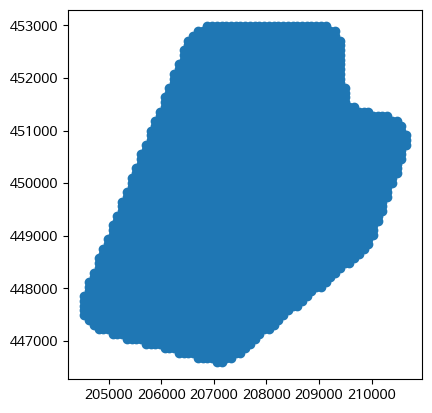

In [ ]:
gdf_slope.plot()

In [ ]:
# Spatial Join: grid_gdf_child_parks의 격자별로 포함된 slope(기울기) 점(값)들을 따로 매칭
grid_slope = gpd.sjoin(grid_gdf_child_parks, gdf_slope, how='left', predicate='intersects')
grid_slope.head()

,geometry,centroid,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수,공시지가,유소년_인구수,노인_인구수,인근공원_수,index_right,x,y,slope
0,"POLYGON ((205567.268 447871.309, 205567.268 44...",POINT (205517.268 447921.309),0,0,0,0,0,0,0,4.466008e+05,0.0,0.0,0,252.0,205526.89,547939.01,10.28
1,"POLYGON ((205567.268 447971.309, 205567.268 44...",POINT (205517.268 448021.309),0,0,0,0,0,0,0,4.466001e+05,0.0,0.0,0,251.0,205526.89,548029.01,14.68
2,"POLYGON ((205567.268 448071.309, 205567.268 44...",POINT (205517.268 448121.309),0,0,0,0,0,0,0,8.587047e+05,0.0,0.0,0,250.0,205526.89,548119.01,16.07
3,"POLYGON ((205567.268 448171.309, 205567.268 44...",POINT (205517.268 448221.309),0,0,0,0,0,0,0,3.282057e+06,8.0,84.0,0,249.0,205526.89,548209.01,14.29
4,"POLYGON ((205567.268 448271.309, 205567.268 44...",POINT (205517.268 448321.309),0,1,1,0,3,1,0,4.902655e+06,23.0,103.0,1,248.0,205526.89,548299.01,13.85


In [ ]:
grid_slope.shape

(1993, 15)

In [ ]:
grid_slope['slope'].isnull().sum()

np.int64(83)

In [ ]:
# 격자별로 각 격자 안에 매칭된 slope 값들의 평균을 구해 '평균 기울기'를 따로 계산
avg_slope = grid_slope.groupby('geometry')['slope'].mean().reset_index()  # .reset_index()가 groupby 결과('geometry'가 index가 됨)를 다시 데이터프레임으로 만들어줌
avg_slope = avg_slope.rename(columns={'slope': '평균_기울기'})

# 계산한 '평균 기울기'를 grid_gdf_child_parks와 merge
grid_gdf_child_parks = grid_gdf_child_parks.merge(avg_slope, on='geometry', how='left')
grid_gdf_child_parks['평균_기울기'] = grid_gdf_child_parks['평균_기울기'].fillna(0)
grid_gdf_child_parks[grid_gdf_child_parks['평균_기울기'] != 0]

,geometry,centroid,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수,공시지가,유소년_인구수,노인_인구수,인근공원_수,평균_기울기
0,"POLYGON ((205567.268 447871.309, 205567.268 44...",POINT (205517.268 447921.309),0,0,0,0,0,0,0,4.466008e+05,0.0,0.0,0,10.280
1,"POLYGON ((205567.268 447971.309, 205567.268 44...",POINT (205517.268 448021.309),0,0,0,0,0,0,0,4.466001e+05,0.0,0.0,0,14.680
2,"POLYGON ((205567.268 448071.309, 205567.268 44...",POINT (205517.268 448121.309),0,0,0,0,0,0,0,8.587047e+05,0.0,0.0,0,16.070
3,"POLYGON ((205567.268 448171.309, 205567.268 44...",POINT (205517.268 448221.309),0,0,0,0,0,0,0,3.282057e+06,8.0,84.0,0,14.290
4,"POLYGON ((205567.268 448271.309, 205567.268 44...",POINT (205517.268 448321.309),0,1,1,0,3,1,0,4.902655e+06,23.0,103.0,1,13.850
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1629,"POLYGON ((209267.268 451671.309, 209267.268 45...",POINT (209217.268 451721.309),0,0,0,0,0,0,0,0.000000e+00,0.0,0.0,0,219.630
1630,"POLYGON ((209267.268 451771.309, 209267.268 45...",POINT (209217.268 451821.309),0,0,0,0,0,0,0,0.000000e+00,0.0,0.0,0,219.820
1631,"POLYGON ((209267.268 451871.309, 209267.268 45...",POINT (209217.268 451921.309),0,0,0,0,0,0,0,0.000000e+00,0.0,0.0,0,219.300
1632,"POLYGON ((209267.268 451971.309, 209267.268 45...",POINT (209217.268 452021.309),0,0,0,0,0,0,0,0.000000e+00,0.0,0.0,0,226.100


#(중복 개념으로 판단되어 변수 제외) 공원 접근성(250mx250m 격자 중심점 기준 가장 가까운 생활권공원까지의 도로 이동거리)

In [ ]:
path = '/content/drive/MyDrive/광진구 공모전 DB/광진구 공모전 데이터/db/4생활권공원_접근성_250/69.1 생활권공원(읍면동격자) 접근성.shp'

gdf_park_accessibility = gpd.read_file(path, encoding='UTF-8')
gdf_park_accessibility = gdf_park_accessibility[gdf_park_accessibility['sgg_nm_k']=='광진구']
gdf_park_accessibility.head(2)

,gid,emd_cd,emd_nm_k,emd_nm_e,sgg_cd,sgg_nm_k,sgg_nm_e,sido_cd,sido_nm_k,sido_nm_e,value,stats_year,raw_d_year,geometry
1166,다사64ba51ba,11215101,중곡동,Junggok-dong,11215,광진구,Gwangjin-gu,11,서울특별시,Seoul,0.497,2023,202310,"POLYGON ((964500 1951500, 964500 1951750, 9647..."
1167,다사64ab51aa,11215101,중곡동,Junggok-dong,11215,광진구,Gwangjin-gu,11,서울특별시,Seoul,0.552,2023,202310,"POLYGON ((964250 1951000, 964250 1951250, 9645..."


In [ ]:
# 좌표계 확인(EPSG:5179 Korea 2000 / Unified CS 통합좌표계)
print(gdf_park_accessibility.crs)

PROJCS["Korea_2000_Korea_Unified_Coordinate_System",GEOGCS["GCS_Korea_2000",DATUM["Korean_Geodetic_Datum_2002",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6737"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",38],PARAMETER["central_meridian",127.5],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",1000000],PARAMETER["false_northing",2000000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]


In [ ]:
# 좌표계 변환(EPSG: 5181 Korea 2000 / Central Belt)
gdf_park_accessibility = gdf_park_accessibility.to_crs(epsg=5181)

In [ ]:
# gdf_park_accessibility = gdf_park_accessibility.rename(columns={'value': '공원_접근거리'})

# # Spatial Join
# centroids_gdf = gpd.GeoDataFrame(grid_gdf_child_parks[['centroid']], geometry='centroid', crs='EPSG:5181')
# grid_park_accessibility = gpd.sjoin(centroids_gdf, gdf_park_accessibility[['geometry', '공원_접근거리']], how='left', predicate='intersects')

# # merge
# grid_gdf_child_parks['공원_접근거리'] = grid_park_accessibility['공원_접근거리'].fillna(0).astype(int)

# # 결과 확인
# grid_gdf_child_parks[grid_gdf_child_parks['공원_접근거리'] != 0]

,geometry,centroid,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수,공시지가,유소년_인구수,노인_인구수,인근공원_수,공원_접근거리
0,"POLYGON ((205567.268 447871.309, 205567.268 44...",POINT (205517.268 447921.309),0,0,0,0,0,0,0,446600.810000,0,0,0,10
1,"POLYGON ((205567.268 447971.309, 205567.268 44...",POINT (205517.268 448021.309),0,0,0,0,0,0,0,446600.060000,0,0,0,10
2,"POLYGON ((205567.268 448071.309, 205567.268 44...",POINT (205517.268 448121.309),0,0,0,0,0,0,0,858704.657500,0,0,0,10
43,"POLYGON ((205667.268 447871.309, 205667.268 44...",POINT (205617.268 447921.309),0,0,0,0,0,0,0,446598.760000,0,0,0,10
44,"POLYGON ((205667.268 447971.309, 205667.268 44...",POINT (205617.268 448021.309),0,0,0,0,0,0,0,446599.896667,0,0,0,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1614,"POLYGON ((209267.268 450171.309, 209267.268 45...",POINT (209217.268 450221.309),0,0,0,0,0,0,0,221013.162500,0,0,0,1
1615,"POLYGON ((209267.268 450271.309, 209267.268 45...",POINT (209217.268 450321.309),0,0,0,0,0,0,0,87138.475000,0,0,0,1
1616,"POLYGON ((209267.268 450371.309, 209267.268 45...",POINT (209217.268 450421.309),0,0,0,0,0,0,0,41849.980000,0,0,0,1
1617,"POLYGON ((209267.268 450471.309, 209267.268 45...",POINT (209217.268 450521.309),0,0,0,0,0,0,0,50000.000000,0,0,0,1


---
###문제 발생: 매핑된 값(예: 1, 10 등)이 원본 데이터에는 없는 값임
 - .astype(int) 때문! (유소년 인구, 노인 인구 코드에도 포함되어 있어 함께 제거)
---

In [ ]:
grid_gdf_child_parks['공원_접근거리'].unique()

array([10,  0,  5,  1, 11,  3,  2,  9])

---
### 문제 제기: 격자 단위 불일치
---
 - "공원 격자 데이터의 중심점(centroid)이 어떤 250m 격자 Polygon에 포함(intersects)되는가?" 를 보고 접근거리를 매핑한 구조 자체는 적절함
  - 매핑된 값 자체는 250m 단위로 해상도가 제한되므로, 결과 해석 시 "100m 분석"이 아니라, 사실상 "250m 정밀도"라는 점에 대한 인식이 필요
---
 - 공시지가처럼 격자 전체를 기준으로 공간 조인하면 어떨까?
  - 공원 접근성 데이터의 핵심은 "250m 단위 격자 중심점 기준 도로 거리"라는 것
  - 단순히 격자 Polygon(geometry) 전체에 대해 조인한다면,

    - 접근거리의 의미가 희석됨:	100m 격자의 어느 위치에서 공원이 가까운지 불명확해짐
    - 거리의 공간적 일관성이 깨짐:	원래는 "중심점 기준 거리"인데, 격자 외곽으로 확장되며 거리 정보의 공간 정확도 저하 발생
    - 공원 접근성 분석 시 오판 가능:	사각지대나 개선 대상 구역을 정확히 파악하기 어려워짐
---

    

### 최종 코드

In [ ]:
gdf_park_accessibility = gdf_park_accessibility.rename(columns={'value': '공원_접근거리'})

# Spatial Join
centroids_gdf = gpd.GeoDataFrame(grid_gdf_child_parks[['centroid']], geometry='centroid', crs='EPSG:5181')
grid_park_accessibility = gpd.sjoin(centroids_gdf, gdf_park_accessibility[['geometry', '공원_접근거리']], how='left', predicate='intersects')

# merge
grid_gdf_child_parks['공원_접근거리'] = grid_park_accessibility['공원_접근거리'].fillna(0)

# 결과 확인
grid_gdf_child_parks[grid_gdf_child_parks['공원_접근거리'] != 0]

,geometry,centroid,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수,공시지가,유소년_인구수,노인_인구수,인근공원_수,공원_접근거리
0,"POLYGON ((205567.268 447871.309, 205567.268 44...",POINT (205517.268 447921.309),0,0,0,0,0,0,0,4.466008e+05,0.0,0.0,0,10.809
1,"POLYGON ((205567.268 447971.309, 205567.268 44...",POINT (205517.268 448021.309),0,0,0,0,0,0,0,4.466001e+05,0.0,0.0,0,10.809
2,"POLYGON ((205567.268 448071.309, 205567.268 44...",POINT (205517.268 448121.309),0,0,0,0,0,0,0,8.587047e+05,0.0,0.0,0,10.809
3,"POLYGON ((205567.268 448171.309, 205567.268 44...",POINT (205517.268 448221.309),0,0,0,0,0,0,0,3.282057e+06,8.0,84.0,0,0.343
4,"POLYGON ((205567.268 448271.309, 205567.268 44...",POINT (205517.268 448321.309),0,1,1,0,3,1,0,4.902655e+06,23.0,103.0,1,0.343
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1614,"POLYGON ((209267.268 450171.309, 209267.268 45...",POINT (209217.268 450221.309),0,0,0,0,0,0,0,2.210132e+05,0.0,0.0,0,1.170
1615,"POLYGON ((209267.268 450271.309, 209267.268 45...",POINT (209217.268 450321.309),0,0,0,0,0,0,0,8.713848e+04,0.0,0.0,0,1.170
1616,"POLYGON ((209267.268 450371.309, 209267.268 45...",POINT (209217.268 450421.309),0,0,0,0,0,0,0,4.184998e+04,0.0,0.0,0,1.608
1617,"POLYGON ((209267.268 450471.309, 209267.268 45...",POINT (209217.268 450521.309),0,0,0,0,0,0,0,5.000000e+04,0.0,0.0,0,1.608


In [ ]:
gdf_park_accessibility[gdf_park_accessibility['공원_접근거리']==1.170]

,gid,emd_cd,emd_nm_k,emd_nm_e,sgg_cd,sgg_nm_k,sgg_nm_e,sido_cd,sido_nm_k,sido_nm_e,공원_접근거리,stats_year,raw_d_year,geometry
1309,다사65aa50ab,11215104,광장동,Gwangjang-dong,11215,광진구,Gwangjin-gu,11,서울특별시,Seoul,1.17,2023,202310,"POLYGON ((209168.746 450161.361, 209167.416 45..."


# 데이터 정규화

---
 - 이진 결정트리나 랜덤 포레스트를 사용할 경우에는 정규화가 꼭 필요하진 않음
 - 결정트리는 각 변수의 값의 절대적인 크기가 아니라, 값의 분할 기준(threshold)을 기준으로 분기하기 때문에 스케일 차이의 영향을 크게 받지 않음
 ---
 - 머신러닝, 특히 결정트리 기반 이외의 모델(예: KNN, 선형회귀, 로지스틱 회귀, SVM 등)을 사용할 경우 **스케일이 큰 변수(예: 공시지가, 접근거리)**가 모델 학습에 영향을 크게 미쳐 정규화가 필요할 수 있음
   - 거리 기반 모델: KNN, K-Means, DBSCAN 등 사용 시에는 꼭 필요.
   - PCA, 시각화: 특성 간 비교 시 왜곡 방지를 위해 필요.
   - 지도 학습의 다른 모델: 결정트리가 아닌 모델을 쓰게 될 경우 (예: XGBoost, 선형모델) 대비해 미리 정규화해두는 것도 전략적일 수 있음
---

In [ ]:
# 우선 데이터베이스 저장 후 머신러닝 분석 전에 정규화 진행

# 최종 데이터베이스

 ### (4) 각 공원과 해당하는 격자 매핑

 *   gdf_child_parks의 각 공원 Point가 grid_gdf_child_parks의 어떤 격자 Polygon 안에
 *  "포함되어 있는지(within)" 확인하고,
 * 포함된다면 해당 격자의 인덱스를 index_right 컬럼으로 추가
   * index_right 컬럼의 NaN 값의 의미는 해당 공원 Point가 어떤 격자에도 해당하지 않는 것

    1.   공원 좌표가 격자 경계 밖에 살짝 벗어났을 수 있음
    2.   또는 좌표 변환 중 오차로 인해 격자 안으로 안 들어간 경우도 있음
    3. 위경도 오기입으로 실제 광진구 밖 공원이 포함됐을 수도 있음

    → how="inner", "intersects(완전히 포함되지 않아도 걸치면 포함)" 등으로 바꾸어 시도






In [ ]:
# 1. 공원 데이터와 격자 데이터를 spatial join으로 연결
gdf_joined = gpd.sjoin(gdf_child_parks, grid_gdf_child_parks, how="left", predicate="intersects")

# 2. 결과 확인 (공원명, 어린이공원 여부, 해당 격자 geometry 등)
gdf_joined[['공원명', '어린이공원_여부', 'geometry', 'index_right']]

,공원명,어린이공원_여부,geometry,index_right
0,성화공원,1,POINT (205467.268 448524.493),6
1,양마장공원,1,POINT (207842.503 447934.079),989
2,자양공원,1,POINT (206174.893 448230.575),304
3,가중나무공원,1,POINT (205982.988 449669.27),232
4,한아름공원,1,POINT (206227.523 449427.286),316
5,햇님공원,1,POINT (205923.136 449244.655),185
6,화양공원,1,POINT (206151.039 449124.34),270
7,남일공원,1,POINT (206511.233 450716.141),458
8,군자공원,1,POINT (206437.183 450562.66),413
9,중곡공원,1,POINT (206992.051 451669.788),682


### (5) 각 공원의 버퍼 안에 있는 격자 찾기

In [ ]:
gdf_child_parks['buffer_250m'] = gdf_child_parks.geometry.buffer(250)
# grid_gdf_child_parks['centroid'] = grid_gdf_child_parks.geometry.centroid

# 결과 저장용 딕셔너리: {공원 index: 해당 격자 index 리스트}
park_grid_map = {}

for park_idx, park_row in gdf_child_parks.iterrows():
    buffer_geom = park_row['buffer_250m']
    # 중심점이 버퍼 안에 포함되는 격자만 추출
    matched_grids = grid_gdf_child_parks[grid_gdf_child_parks['centroid'].within(buffer_geom)]

    # 매핑 저장
    park_grid_map[park_idx] = matched_grids.index.tolist()

### (6) 전체 공원에 대한 격자 매핑 테이블화

In [ ]:
# park_id, grid_index 쌍으로 DataFrame 생성
rows = []
for park_id, grid_indices in park_grid_map.items():
    for grid_idx in grid_indices:
        rows.append({'공원_ID': park_id, '격자_ID': grid_idx})

df_park_grid_mapping = pd.DataFrame(rows)
df_park_grid_mapping

,공원_ID,격자_ID
0,0,4
1,0,5
2,0,6
3,0,7
4,0,8
...,...,...
797,42,309
798,42,310
799,42,350
800,42,351


### (7) 격자별 변수 값 매핑

In [ ]:
grid_gdf_child_parks.columns

Index(['geometry', 'centroid', '초등학교_수', '유치원_수', '지역아동센터_수', '키즈카페_수',
       '청소년유해업소_수', '공영주차장_수', '노인복지시설_수', '공시지가', '유소년_인구수', '노인_인구수',
       '인근공원_수', '평균_기울기'],
      dtype='object')

In [ ]:
# 격자 정보 붙이기 (join)
df_park_grid_mapping = df_park_grid_mapping.merge(
    grid_gdf_child_parks[['초등학교_수', '유치원_수', '지역아동센터_수', '키즈카페_수',
       '청소년유해업소_수', '공영주차장_수', '노인복지시설_수', '공시지가', '유소년_인구수', '노인_인구수',
       '인근공원_수', '평균_기울기']],
    left_on='격자_ID',
    right_index=True,
    how='left'
)

# 결과 확인
df_park_grid_mapping

,공원_ID,격자_ID,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수,공시지가,유소년_인구수,노인_인구수,인근공원_수,평균_기울기
0,0,4,0,1,1,0,3,1,0,4.902655e+06,23.0,103.0,1,13.850
1,0,5,0,1,1,0,8,1,0,4.484785e+06,8.0,117.0,1,14.250
2,0,6,0,2,1,0,9,1,0,4.684056e+06,0.0,36.0,1,13.640
3,0,7,0,2,1,0,8,0,0,5.930163e+06,0.0,0.0,1,13.620
4,0,8,0,2,1,0,8,0,0,7.363236e+06,259.0,267.0,1,14.100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
797,42,309,0,0,0,2,4,1,1,1.126702e+07,0.0,405.0,2,14.890
798,42,310,0,0,0,2,16,1,1,9.988754e+06,0.0,0.0,2,14.510
799,42,350,2,2,0,0,0,0,1,5.207398e+06,67.0,135.0,1,15.045
800,42,351,1,1,0,0,0,0,1,8.824441e+06,107.0,184.0,1,15.850


In [ ]:
grid_gdf_child_parks[['유소년_인구수']].iloc[3:11]

,유소년_인구수
3,8.0
4,23.0
5,8.0
6,0.0
7,0.0
8,259.0
9,0.0
10,0.0


In [ ]:
grid_gdf_child_parks[['유소년_인구수']].iloc[350:353]

,유소년_인구수
350,67.0
351,107.0
352,0.0


###(8-1) 최종 데이터베이스(Polygon=격자_ID)

In [ ]:
# 1. df_park_grid_mapping의 '공원_ID'를 index로 설정 (gdf_joined의 index와 맞추기 위해)
df_park_grid_mapping_indexed = df_park_grid_mapping.set_index('공원_ID')

# 2. gdf_joined와 병합 (index 기준)
gdf_joined_polygon_final = gdf_joined[['공원명', '어린이공원_여부', 'geometry', 'index_right']].join(df_park_grid_mapping_indexed, how='right')

pd.set_option('display.max_columns', None)
gdf_joined_polygon_final

,공원명,어린이공원_여부,geometry,index_right,격자_ID,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수,공시지가,유소년_인구수,노인_인구수,인근공원_수,평균_기울기
0,성화공원,1,POINT (205467.268 448524.493),6,4,0,1,1,0,3,1,0,4.902655e+06,23.0,103.0,1,13.850
0,성화공원,1,POINT (205467.268 448524.493),6,5,0,1,1,0,8,1,0,4.484785e+06,8.0,117.0,1,14.250
0,성화공원,1,POINT (205467.268 448524.493),6,6,0,2,1,0,9,1,0,4.684056e+06,0.0,36.0,1,13.640
0,성화공원,1,POINT (205467.268 448524.493),6,7,0,2,1,0,8,0,0,5.930163e+06,0.0,0.0,1,13.620
0,성화공원,1,POINT (205467.268 448524.493),6,8,0,2,1,0,8,0,0,7.363236e+06,259.0,267.0,1,14.100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42,신양소공원(가칭),0,POINT (206093.13 448611.78),265,309,0,0,0,2,4,1,1,1.126702e+07,0.0,405.0,2,14.890
42,신양소공원(가칭),0,POINT (206093.13 448611.78),265,310,0,0,0,2,16,1,1,9.988754e+06,0.0,0.0,2,14.510
42,신양소공원(가칭),0,POINT (206093.13 448611.78),265,350,2,2,0,0,0,0,1,5.207398e+06,67.0,135.0,1,15.045
42,신양소공원(가칭),0,POINT (206093.13 448611.78),265,351,1,1,0,0,0,0,1,8.824441e+06,107.0,184.0,1,15.850


In [ ]:
gdf_joined_polygon_final = gdf_joined_polygon_final.rename(columns={'index_right': 'Point_격자_ID'})

In [ ]:
gdf_joined_polygon_final.head(2)

,공원명,어린이공원_여부,geometry,Point_격자_ID,격자_ID,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수,공시지가,유소년_인구수,노인_인구수,인근공원_수,평균_기울기
0,성화공원,1,POINT (205467.268 448524.493),6,4,0,1,1,0,3,1,0,4902655.15,23.0,103.0,1,13.85
0,성화공원,1,POINT (205467.268 448524.493),6,5,0,1,1,0,8,1,0,4484784.93,8.0,117.0,1,14.25


In [ ]:
# gdf_joined_polygon_final.to_excel('/content/drive/MyDrive/광진구 공모전 DB/광진구 공모전 데이터/최종_학습용_데이터베이스(Polygon별).xlsx', index=True)
# gdf_joined_polygon_final.to_excel('/content/drive/MyDrive/광진구 공모전 DB/최종_학습용_데이터베이스(Polygon별).xlsx', index=True)

### (8-2) 최종 데이터베이스(Point)

In [ ]:
# 그룹화 및 합계 계산
df_park_final = df_park_grid_mapping.groupby('공원_ID').sum(numeric_only=True).reset_index()

In [ ]:
df_park_final # 격자_ID도 sum()으로 합산되어, 무의미한 수치임에 유의

,공원_ID,격자_ID,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수,공시지가,유소년_인구수,노인_인구수,인근공원_수,평균_기울기
0,0,228,0,15,8,0,94,5,2,4.904999e+07,304.0,718.0,9,127.9200
1,1,12868,18,20,1,0,10,5,25,6.102262e+07,178.0,721.0,23,329.7450
2,2,5479,21,35,1,0,10,0,7,1.061416e+08,898.0,1511.0,37,290.8600
3,3,4013,0,0,0,0,157,4,11,8.666003e+07,131.0,645.0,25,267.8000
4,4,6636,0,0,0,0,360,14,2,1.140626e+08,111.0,954.0,39,353.7050
5,5,3885,0,12,8,2,719,2,15,1.264797e+08,151.0,1066.0,33,276.6450
6,6,5302,0,1,3,14,820,6,3,1.509450e+08,56.0,620.0,38,258.3250
7,7,9618,5,24,14,0,91,0,2,8.349766e+07,269.0,1301.0,30,354.2100
8,8,8026,11,28,9,0,41,0,18,7.475768e+07,234.0,1095.0,28,291.5050
9,9,12793,14,24,24,0,208,0,23,7.102868e+07,329.0,1281.0,18,307.4600


In [ ]:
# 1. df_park_final의 '공원_ID'를 index로 설정 (gdf_joined의 index와 맞추기 위해)
df_park_final_indexed = df_park_final.set_index('공원_ID')

# 2. gdf_joined와 병합 (index 기준)
gdf_joined_final = gdf_joined[['공원명', '어린이공원_여부', 'geometry', 'index_right']].join(df_park_final_indexed, how='left')

pd.set_option('display.max_columns', None)
gdf_joined_final.head()

,공원명,어린이공원_여부,geometry,index_right,격자_ID,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수,공시지가,유소년_인구수,노인_인구수,인근공원_수,평균_기울기
0,성화공원,1,POINT (205467.268 448524.493),6,228,0,15,8,0,94,5,2,4.904999e+07,304.0,718.0,9,127.920
1,양마장공원,1,POINT (207842.503 447934.079),989,12868,18,20,1,0,10,5,25,6.102262e+07,178.0,721.0,23,329.745
2,자양공원,1,POINT (206174.893 448230.575),304,5479,21,35,1,0,10,0,7,1.061416e+08,898.0,1511.0,37,290.860
3,가중나무공원,1,POINT (205982.988 449669.27),232,4013,0,0,0,0,157,4,11,8.666003e+07,131.0,645.0,25,267.800
4,한아름공원,1,POINT (206227.523 449427.286),316,6636,0,0,0,0,360,14,2,1.140626e+08,111.0,954.0,39,353.705


In [ ]:
gdf_joined_final = gdf_joined_final.drop(columns='격자_ID')
gdf_joined_final = gdf_joined_final.rename(columns={'index_right': '격자_ID'})
gdf_joined_final

,공원명,어린이공원_여부,geometry,격자_ID,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수,공시지가,유소년_인구수,노인_인구수,인근공원_수,평균_기울기
0,성화공원,1,POINT (205467.268 448524.493),6,0,15,8,0,94,5,2,4.904999e+07,304.0,718.0,9,127.9200
1,양마장공원,1,POINT (207842.503 447934.079),989,18,20,1,0,10,5,25,6.102262e+07,178.0,721.0,23,329.7450
2,자양공원,1,POINT (206174.893 448230.575),304,21,35,1,0,10,0,7,1.061416e+08,898.0,1511.0,37,290.8600
3,가중나무공원,1,POINT (205982.988 449669.27),232,0,0,0,0,157,4,11,8.666003e+07,131.0,645.0,25,267.8000
4,한아름공원,1,POINT (206227.523 449427.286),316,0,0,0,0,360,14,2,1.140626e+08,111.0,954.0,39,353.7050
5,햇님공원,1,POINT (205923.136 449244.655),185,0,12,8,2,719,2,15,1.264797e+08,151.0,1066.0,33,276.6450
6,화양공원,1,POINT (206151.039 449124.34),270,0,1,3,14,820,6,3,1.509450e+08,56.0,620.0,38,258.3250
7,남일공원,1,POINT (206511.233 450716.141),458,5,24,14,0,91,0,2,8.349766e+07,269.0,1301.0,30,354.2100
8,군자공원,1,POINT (206437.183 450562.66),413,11,28,9,0,41,0,18,7.475768e+07,234.0,1095.0,28,291.5050
9,중곡공원,1,POINT (206992.051 451669.788),682,14,24,24,0,208,0,23,7.102868e+07,329.0,1281.0,18,307.4600


In [ ]:
# gdf_joined_final.to_excel('/content/drive/MyDrive/광진구 공모전 DB/광진구 공모전 데이터/최종_학습용_데이터베이스(Point별).xlsx', index=True)
# gdf_joined_final.to_excel('/content/drive/MyDrive/광진구 공모전 DB/최종_학습용_데이터베이스(Point별).xlsx', index=True)

# 광진구 행정동별 경계화 지도

In [ ]:
# 서울 지도 초기화
seoul = folium.Map(location=[37.55, 126.98], zoom_start=11)

# GeoJSON 파일 로드
geo_path = '/content/drive/MyDrive/광진구 공모전 DB/0서울_geojson.geojson'
geo_data = json.load(open(geo_path, encoding='utf-8'))

In [ ]:
# 서울 지도 동별 경계화
folium.GeoJson(
    geo_data,
    name='서울 동별 경계',
    style_function=lambda feature: {
        'fillColor': 'transparent',  # 채우기 색상은 투명
        'color': 'green',  # 경계선 색상 초록
        'weight': 1.4,  # 선 굵기
        'opacity': 1  # 선의 불투명도
    }
).add_to(seoul)
seoul

In [ ]:
# 광진구 지도 동별 경계화
gwangjin_map = folium.Map(location=[37.538, 127.082], tiles='cartodbpositron', zoom_start=13.3)

folium.GeoJson(
    geo_data,
    name='서울 동별 경계',
    style_function=lambda feature: {
        'fillColor': 'lightblue' if feature['properties']['sggnm'] == '광진구' else 'transparent',
        'color': 'green',
        'weight': 2,
        'opacity': 0.1 if feature['properties']['sggnm'] != '광진구' else 1
    }
).add_to(gwangjin_map)

folium.TileLayer('CartoDB positron').add_to(gwangjin_map)
folium.LayerControl().add_to(gwangjin_map)
gwangjin_map